# Analisis de Datasets - Sistema ANPR Colombia

Este notebook combina los scripts de **preparacion** y **analisis** de los dos datasets principales:

| Dataset | Descripcion | Imagenes | Clases |
|---------|-------------|----------|--------|
| `dataset_combinado/` | Placas vehiculares colombianas | ~1,212 | 1 (placa) |
| `dataset_marcas_combinado/` | Marcas/logos vehiculares | ~21,553 | 30 marcas |

**Scripts integrados:**
1. `01_preparar_dataset.py` - Preparacion dataset de placas
2. `05_preparar_dataset_marcas.py` - Preparacion dataset de marcas
3. `07_analisis_dataset_marcas.py` - Analisis visual del dataset de marcas (15 graficas)
4. `08_analisis_dataset_placas.py` - Analisis visual del dataset de placas (13 graficas)

In [1]:
!pip install matplotlib numpy pyyaml Pillow -q

In [2]:
%matplotlib inline

import os
import sys
import yaml
import shutil
import random
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from pathlib import Path
from collections import Counter, defaultdict
from PIL import Image

plt.rcParams["figure.dpi"] = 120
plt.rcParams["savefig.dpi"] = 150
plt.rcParams["font.size"] = 10

# Detectar directorio del proyecto
PROJECT_DIR = Path.cwd()
if not (PROJECT_DIR / "dataset_combinado").exists():
    PROJECT_DIR = Path(r"c:\Users\user\OneDrive - Universidad de la Sabana\AI_LAB\Sistema-deteccion-de-placas-OCR")

print(f"Directorio del proyecto: {PROJECT_DIR}")
print(f"dataset_combinado existe: {(PROJECT_DIR / 'dataset_combinado').exists()}")
print(f"dataset_marcas_combinado existe: {(PROJECT_DIR / 'dataset_marcas_combinado').exists()}")

Directorio del proyecto: c:\Users\user\OneDrive - Universidad de la Sabana\AI_LAB\Sistema-deteccion-de-placas-OCR
dataset_combinado existe: True
dataset_marcas_combinado existe: True


In [3]:
# --- Constantes comunes ---
SPLITS = ["train", "valid", "test"]
SPLIT_LABELS = {"train": "Train", "valid": "Valid", "test": "Test"}
COLOR_TRAIN = "#2196F3"
COLOR_VALID = "#FF9800"
COLOR_TEST  = "#4CAF50"
SPLIT_COLORS = {"train": COLOR_TRAIN, "valid": COLOR_VALID, "test": COLOR_TEST}
SOURCE_COLORS = {"DS1": "#E91E63", "DS2": "#3F51B5", "DS3": "#009688", "Desconocido": "#9E9E9E"}

def get_class_colors(n):
    cmap = plt.colormaps.get_cmap("tab20").resampled(n)
    return [cmap(i) for i in range(n)]

---
# PARTE 1: Preparacion del Dataset de Placas
*Script original: `scripts/01_preparar_dataset.py`*

Combina 3 datasets de Roboflow en una estructura unificada para deteccion de placas colombianas.
- **1 clase**: `placa`
- **3 fuentes**: Proyecto-Placas-1, Placas(200img), Placas(600img)
- Prefijos `ds1_`, `ds2_`, `ds3_` para evitar colisiones de nombres

In [4]:
# --- Configuracion Dataset Placas ---
PLACAS_DATASETS_DIR = PROJECT_DIR.parent  # Carpeta que contiene los datasets fuente
PLACAS_OUTPUT_DIR = PROJECT_DIR / "dataset_combinado"

PLACAS_DATASETS = [
    PLACAS_DATASETS_DIR / "Proyecto-Placas-1",
    PLACAS_DATASETS_DIR / "Proyecto Placas(200img).v1i.yolov11",
    PLACAS_DATASETS_DIR / "Proyecto Placas(600img).v2i.yolov11",
]

print("=== DATASETS FUENTE DE PLACAS ===")
for i, ds in enumerate(PLACAS_DATASETS, 1):
    existe = ds.exists()
    print(f"  DS{i}: {'[OK]' if existe else '[X]'} {ds.name}")

=== DATASETS FUENTE DE PLACAS ===
  DS1: [X] Proyecto-Placas-1
  DS2: [X] Proyecto Placas(200img).v1i.yolov11
  DS3: [X] Proyecto Placas(600img).v2i.yolov11


In [5]:
def copiar_dataset_placas(dataset_path, output_base, prefix):
    """Copia un dataset al directorio de salida con un prefijo unico."""
    stats = defaultdict(int)
    for split in SPLITS:
        img_src = dataset_path / split / "images"
        lbl_src = dataset_path / split / "labels"
        img_dst = output_base / split / "images"
        lbl_dst = output_base / split / "labels"
        img_dst.mkdir(parents=True, exist_ok=True)
        lbl_dst.mkdir(parents=True, exist_ok=True)
        if not img_src.exists():
            continue
        for img_file in img_src.iterdir():
            if img_file.suffix.lower() in [".jpg", ".jpeg", ".png"]:
                new_name = f"{prefix}_{img_file.name}"
                shutil.copy2(img_file, img_dst / new_name)
                stats[f"{split}_images"] += 1
        if lbl_src.exists():
            for lbl_file in lbl_src.iterdir():
                if lbl_file.suffix == ".txt":
                    new_name = f"{prefix}_{lbl_file.name}"
                    shutil.copy2(lbl_file, lbl_dst / new_name)
                    stats[f"{split}_labels"] += 1
    return dict(stats)


def crear_data_yaml_placas(output_dir):
    """Crea el archivo data.yaml para placas."""
    data_config = {
        "path": str(output_dir.absolute()),
        "train": "train/images", "val": "valid/images", "test": "test/images",
        "nc": 1, "names": ["placa"],
        "proyecto": "ANPR Colombia - Reconocimiento de Placas",
        "version": "1.0",
        "descripcion": "Dataset combinado para deteccion de placas vehiculares colombianas",
    }
    yaml_path = output_dir / "data.yaml"
    with open(yaml_path, "w", encoding="utf-8") as f:
        yaml.dump(data_config, f, default_flow_style=False, allow_unicode=True)
    return yaml_path


def verificar_integridad(output_dir):
    """Verifica que cada imagen tenga su archivo de etiquetas."""
    problemas = []
    for split in SPLITS:
        img_dir = output_dir / split / "images"
        lbl_dir = output_dir / split / "labels"
        if not img_dir.exists():
            continue
        for img_file in img_dir.iterdir():
            if img_file.suffix.lower() in [".jpg", ".jpeg", ".png"]:
                lbl_file = lbl_dir / f"{img_file.stem}.txt"
                if not lbl_file.exists():
                    problemas.append(img_file.name)
    if problemas:
        print(f"  [!] {len(problemas)} imagenes sin etiqueta")
        for p in problemas[:5]:
            print(f"      - {p}")
        return False
    print("  [OK] Integridad verificada correctamente")
    return True

In [6]:
# --- Ejecutar preparacion de placas (solo si no existe) ---
if PLACAS_OUTPUT_DIR.exists():
    print("[OK] Dataset de placas ya existe, verificando...")
    for split in SPLITS:
        img_dir = PLACAS_OUTPUT_DIR / split / "images"
        n = len(list(img_dir.glob("*"))) if img_dir.exists() else 0
        print(f"  {split}: {n} imagenes")
    verificar_integridad(PLACAS_OUTPUT_DIR)
else:
    print("[*] Preparando dataset de placas...")
    PLACAS_OUTPUT_DIR.mkdir(parents=True)
    total_stats = defaultdict(int)
    for i, dataset in enumerate(PLACAS_DATASETS, 1):
        if not dataset.exists():
            print(f"  [!] No encontrado: {dataset.name}")
            continue
        prefix = f"ds{i}"
        stats = copiar_dataset_placas(dataset, PLACAS_OUTPUT_DIR, prefix)
        for k, v in stats.items():
            total_stats[k] += v
        print(f"  [{i}] {dataset.name}: {stats}")
    crear_data_yaml_placas(PLACAS_OUTPUT_DIR)
    verificar_integridad(PLACAS_OUTPUT_DIR)
    total = sum(v for k, v in total_stats.items() if "images" in k)
    print(f"  [OK] Total: {total} imagenes preparadas")

[OK] Dataset de placas ya existe, verificando...
  train: 975 imagenes
  valid: 174 imagenes
  test: 63 imagenes
  [OK] Integridad verificada correctamente


---
# PARTE 2: Preparacion del Dataset de Marcas
*Script original: `scripts/05_preparar_dataset_marcas.py`*

Combina 3 datasets de Roboflow con diferentes marcas vehiculares en 30 clases unificadas.
- **30 clases** (orden alfabetico)
- **3 fuentes**: Dataset1 (9 marcas), Dataset2 (20 marcas), Dataset3 (23 marcas)
- DS3 tiene clase "Plate" (ID 16) que se **excluye**
- Remapeo de class IDs a esquema unificado

In [7]:
# --- Esquema unificado de 30 clases ---
UNIFIED_NAMES = [
    "Acura", "Audi", "BMW", "Chevrolet", "Citroen", "Dacia", "Fiat", "Ford",
    "Honda", "Hyundai", "Infiniti", "KIA", "Lamborghini", "Lexus", "Mazda",
    "MercedesBenz", "Mitsubishi", "Nissan", "Opel", "Perodua", "Peugeot",
    "Porsche", "Proton", "Renault", "Seat", "Suzuki", "Tesla", "Toyota",
    "Volkswagen", "Volvo",
]
NUM_CLASSES = len(UNIFIED_NAMES)
print(f"Clases unificadas: {NUM_CLASSES}")
for i, name in enumerate(UNIFIED_NAMES):
    print(f"  {i:>2}: {name}")

Clases unificadas: 30
   0: Acura
   1: Audi
   2: BMW
   3: Chevrolet
   4: Citroen
   5: Dacia
   6: Fiat
   7: Ford
   8: Honda
   9: Hyundai
  10: Infiniti
  11: KIA
  12: Lamborghini
  13: Lexus
  14: Mazda
  15: MercedesBenz
  16: Mitsubishi
  17: Nissan
  18: Opel
  19: Perodua
  20: Peugeot
  21: Porsche
  22: Proton
  23: Renault
  24: Seat
  25: Suzuki
  26: Tesla
  27: Toyota
  28: Volkswagen
  29: Volvo


In [8]:
# --- Tablas de remapeo: class_id_original -> class_id_unificado ---

# Dataset1: 9 clases (BMW, Honda, Hyundai, Mazda, MercedesBenz, Perodua, Proton, Toyota, Volkswagen)
CLASS_REMAP_DS1 = {0:2, 1:8, 2:9, 3:14, 4:15, 5:19, 6:22, 7:27, 8:28}

# Dataset2: 20 clases
CLASS_REMAP_DS2 = {0:0, 1:1, 2:2, 3:3, 4:7, 5:8, 6:9, 7:10, 8:11, 9:12,
                   10:13, 11:14, 12:15, 13:17, 14:19, 15:21, 16:22, 17:26, 18:27, 19:28}

# Dataset3: 23 clases (clase 16=Plate EXCLUIDA)
CLASS_REMAP_DS3 = {0:1, 1:2, 2:4, 3:5, 4:6, 5:7, 6:8, 7:9, 8:11, 9:13,
                   10:14, 11:15, 12:16, 13:17, 14:18, 15:20,
                   17:23, 18:24, 19:25, 20:27, 21:28, 22:29}

EXCLUDE_CLASSES = {"ds1": set(), "ds2": set(), "ds3": {16}}

MARCAS_DATASET_DIR = PROJECT_DIR / "Dataset-marcas"
MARCAS_DATASETS = {"ds1": MARCAS_DATASET_DIR / "Dataset1",
                   "ds2": MARCAS_DATASET_DIR / "Dataset2",
                   "ds3": MARCAS_DATASET_DIR / "Dataset3"}
MARCAS_OUTPUT_DIR = PROJECT_DIR / "dataset_marcas_combinado"
DATASET_CONFIG = {
    "ds1": (CLASS_REMAP_DS1, EXCLUDE_CLASSES["ds1"]),
    "ds2": (CLASS_REMAP_DS2, EXCLUDE_CLASSES["ds2"]),
    "ds3": (CLASS_REMAP_DS3, EXCLUDE_CLASSES["ds3"]),
}

print("=== DATASETS FUENTE DE MARCAS ===")
for prefix, path in MARCAS_DATASETS.items():
    existe = path.exists()
    print(f"  {prefix}: {'[OK]' if existe else '[X]'} {path.name}")

=== DATASETS FUENTE DE MARCAS ===
  ds1: [OK] Dataset1
  ds2: [OK] Dataset2
  ds3: [OK] Dataset3


In [9]:
def remap_label_file(label_path, output_path, class_remap, exclude_classes):
    """Lee un label YOLO, remapea class IDs y excluye clases. Retorna num anotaciones escritas."""
    valid_lines = []
    with open(label_path, "r") as f:
        for line in f:
            line = line.strip()
            if not line:
                continue
            parts = line.split()
            if len(parts) < 5:
                continue
            old_cls = int(parts[0])
            if old_cls in exclude_classes:
                continue
            if old_cls not in class_remap:
                continue
            parts[0] = str(class_remap[old_cls])
            valid_lines.append(" ".join(parts))
    if valid_lines:
        with open(output_path, "w") as f:
            f.write("\n".join(valid_lines) + "\n")
    return len(valid_lines)


def copiar_dataset_con_remap(dataset_path, output_base, prefix, class_remap, exclude_classes):
    """Copia un dataset con remapeo de clases."""
    stats = defaultdict(int)
    for split in SPLITS:
        img_src = dataset_path / split / "images"
        lbl_src = dataset_path / split / "labels"
        img_dst = output_base / split / "images"
        lbl_dst = output_base / split / "labels"
        img_dst.mkdir(parents=True, exist_ok=True)
        lbl_dst.mkdir(parents=True, exist_ok=True)
        if not img_src.exists():
            continue
        for img_file in sorted(img_src.iterdir()):
            if img_file.suffix.lower() not in [".jpg", ".jpeg", ".png"]:
                continue
            lbl_file = lbl_src / f"{img_file.stem}.txt"
            new_name_base = f"{prefix}_{img_file.stem}"
            if lbl_file.exists():
                output_lbl = lbl_dst / f"{new_name_base}.txt"
                n = remap_label_file(lbl_file, output_lbl, class_remap, exclude_classes)
                if n == 0:
                    if output_lbl.exists():
                        output_lbl.unlink()
                    stats[f"{split}_excluded"] += 1
                    continue
                shutil.copy2(img_file, img_dst / f"{new_name_base}{img_file.suffix}")
                stats[f"{split}_images"] += 1
            else:
                shutil.copy2(img_file, img_dst / f"{new_name_base}{img_file.suffix}")
                (lbl_dst / f"{new_name_base}.txt").touch()
                stats[f"{split}_images"] += 1
    return dict(stats)


def crear_data_yaml_marcas(output_dir):
    """Crea data.yaml para el dataset de marcas."""
    data_config = {
        "path": str(output_dir.absolute()),
        "train": "train/images", "val": "valid/images", "test": "test/images",
        "nc": NUM_CLASSES, "names": UNIFIED_NAMES,
        "proyecto": "ANPR Colombia - Deteccion de Marcas Vehiculares",
        "version": "1.0",
        "descripcion": f"Dataset combinado de {NUM_CLASSES} marcas vehiculares (3 datasets)",
    }
    yaml_path = output_dir / "data.yaml"
    with open(yaml_path, "w", encoding="utf-8") as f:
        yaml.dump(data_config, f, default_flow_style=False, allow_unicode=True)
    return yaml_path

In [10]:
# --- Ejecutar preparacion de marcas (solo si no existe) ---
if MARCAS_OUTPUT_DIR.exists():
    print("[OK] Dataset de marcas ya existe, verificando...")
    for split in SPLITS:
        img_dir = MARCAS_OUTPUT_DIR / split / "images"
        n = len(list(img_dir.glob("*"))) if img_dir.exists() else 0
        print(f"  {split}: {n} imagenes")
    verificar_integridad(MARCAS_OUTPUT_DIR)
else:
    print("[*] Preparando dataset de marcas...")
    MARCAS_OUTPUT_DIR.mkdir(parents=True)
    process_order = ["ds2", "ds1", "ds3"]
    for i, prefix in enumerate(process_order, 1):
        dataset_path = MARCAS_DATASETS[prefix]
        if not dataset_path.exists():
            print(f"  [!] No encontrado: {dataset_path}")
            continue
        class_remap, exclude_cls = DATASET_CONFIG[prefix]
        stats = copiar_dataset_con_remap(dataset_path, MARCAS_OUTPUT_DIR, prefix, class_remap, exclude_cls)
        imgs = sum(v for k, v in stats.items() if "images" in k)
        print(f"  [{i}] {dataset_path.name} ({prefix}): {imgs} imagenes")
    crear_data_yaml_marcas(MARCAS_OUTPUT_DIR)
    verificar_integridad(MARCAS_OUTPUT_DIR)
    print("  [OK] Dataset de marcas preparado")

[OK] Dataset de marcas ya existe, verificando...
  train: 17137 imagenes
  valid: 2786 imagenes
  test: 1630 imagenes
  [OK] Integridad verificada correctamente


---
# PARTE 3: Analisis del Dataset de Marcas Vehiculares
*Script original: `scripts/07_analisis_dataset_marcas.py`*

15 graficas para entender la distribucion, balance y caracteristicas del dataset de 30 marcas.

In [11]:
# --- Carga de datos del dataset de marcas ---
MARCAS_GRAFICAS_DIR = PROJECT_DIR / "graficas_dataset"
MARCAS_GRAFICAS_DIR.mkdir(exist_ok=True)

def parse_labels(dataset_dir, split):
    """Lee todas las anotaciones de un split."""
    labels_dir = dataset_dir / split / "labels"
    annotations, files_info = [], []
    if not labels_dir.exists():
        return annotations, files_info
    for lf in sorted(labels_dir.glob("*.txt")):
        file_annots = []
        with open(lf, "r") as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) >= 5:
                    fname = lf.stem
                    source = "DS1" if fname.startswith("ds1_") else "DS2" if fname.startswith("ds2_") else "DS3" if fname.startswith("ds3_") else "Desconocido"
                    annotations.append({
                        "class_id": int(parts[0]),
                        "x_center": float(parts[1]), "y_center": float(parts[2]),
                        "width": float(parts[3]), "height": float(parts[4]),
                        "split": split, "source": source, "file": fname,
                    })
                    file_annots.append(int(parts[0]))
        files_info.append({"file": lf.stem, "num_annotations": len(file_annots), "classes": file_annots})
    return annotations, files_info

# Cargar datos de marcas
marcas_config_path = MARCAS_OUTPUT_DIR / "data.yaml"
with open(marcas_config_path, "r", encoding="utf-8") as f:
    marcas_config = yaml.safe_load(f)
class_names = marcas_config["names"]

marcas_annotations = []
marcas_files = {}
for split in SPLITS:
    annots, files = parse_labels(MARCAS_OUTPUT_DIR, split)
    marcas_annotations.extend(annots)
    marcas_files[split] = files
    print(f"  {split}: {len(annots)} anotaciones, {len(files)} imagenes")
print(f"  TOTAL: {len(marcas_annotations)} anotaciones")

  train: 19117 anotaciones, 17137 imagenes
  valid: 3021 anotaciones, 2786 imagenes
  test: 1773 anotaciones, 1630 imagenes
  TOTAL: 23911 anotaciones


## 3.1 Distribucion total de clases

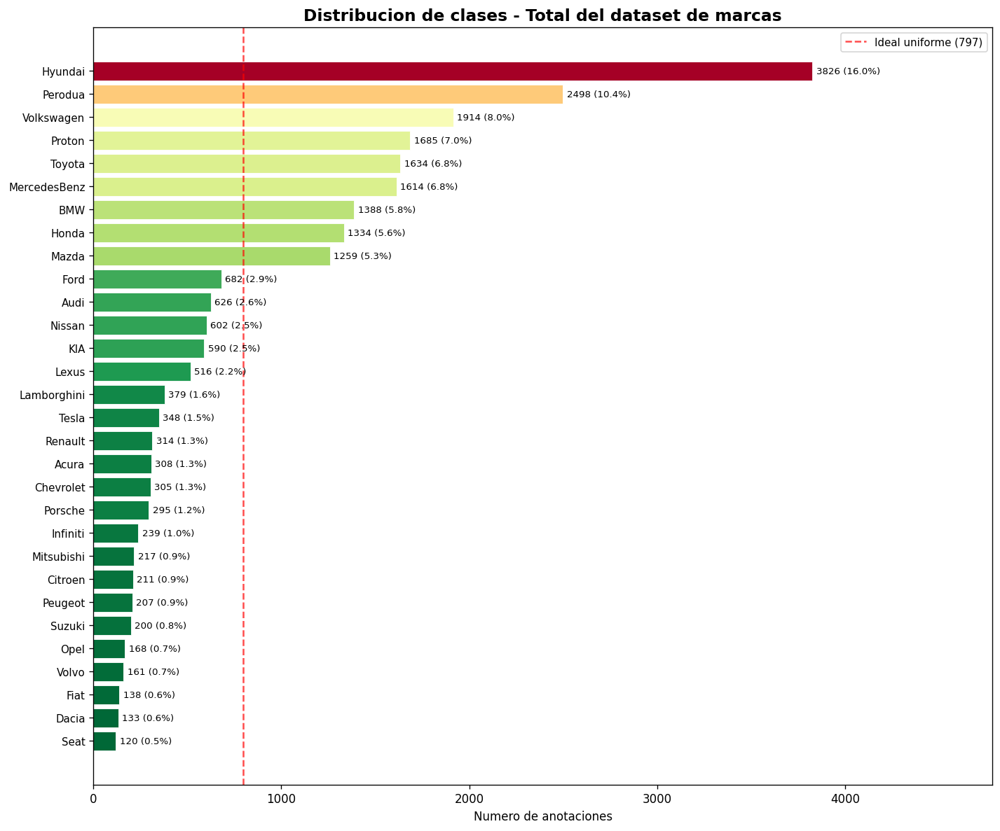

In [12]:
fig, ax = plt.subplots(figsize=(12, 10))
counts = Counter(a["class_id"] for a in marcas_annotations)
classes = list(range(len(class_names)))
values = [counts.get(c, 0) for c in classes]
sorted_pairs = sorted(zip(classes, values), key=lambda x: x[1])
sorted_classes, sorted_values = zip(*sorted_pairs)
sorted_names = [class_names[c] for c in sorted_classes]
norm = plt.Normalize(min(sorted_values), max(sorted_values))
colors = plt.cm.RdYlGn_r(norm(sorted_values))
bars = ax.barh(range(len(sorted_names)), sorted_values, color=colors, edgecolor="white", linewidth=0.5)
ax.set_yticks(range(len(sorted_names)))
ax.set_yticklabels(sorted_names, fontsize=9)
ax.set_xlabel("Numero de anotaciones")
ax.set_title("Distribucion de clases - Total del dataset de marcas", fontsize=14, fontweight="bold")
for bar, val in zip(bars, sorted_values):
    pct = val / sum(sorted_values) * 100
    ax.text(bar.get_width() + 20, bar.get_y() + bar.get_height()/2, f"{val} ({pct:.1f}%)", va="center", fontsize=8)
ideal = len(marcas_annotations) / len(class_names)
ax.axvline(ideal, color="red", linestyle="--", alpha=0.7, label=f"Ideal uniforme ({ideal:.0f})")
ax.legend(fontsize=9)
ax.set_xlim(0, max(sorted_values) * 1.25)
plt.tight_layout()
fig.savefig(MARCAS_GRAFICAS_DIR / "01_distribucion_clases_total.png", dpi=150, bbox_inches="tight")
plt.show()

## 3.2 Distribucion de clases por split

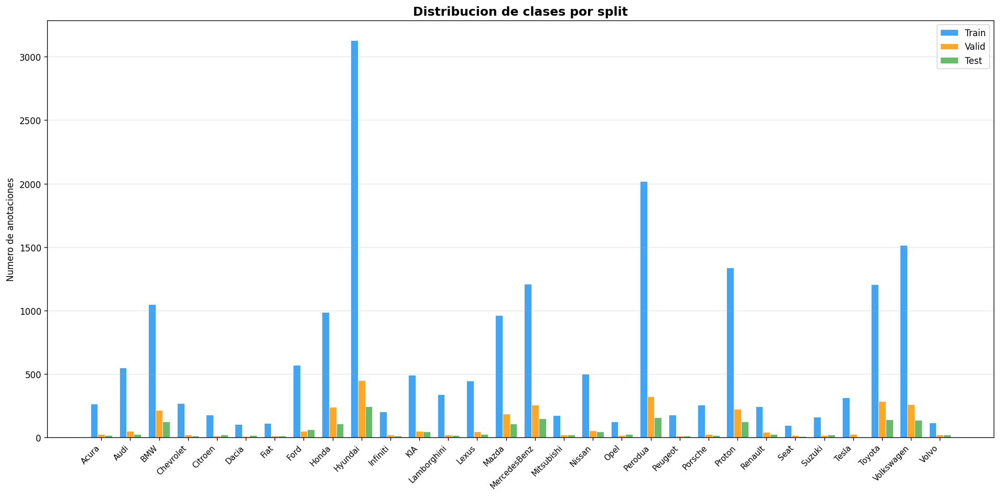

In [13]:
fig, ax = plt.subplots(figsize=(16, 8))
split_counts = {}
for split in SPLITS:
    c = Counter(a["class_id"] for a in marcas_annotations if a["split"] == split)
    split_counts[split] = [c.get(i, 0) for i in range(len(class_names))]
x = np.arange(len(class_names))
width = 0.25
for i, split in enumerate(SPLITS):
    ax.bar(x + (i-1)*width, split_counts[split], width, label=SPLIT_LABELS[split],
           color=SPLIT_COLORS[split], alpha=0.85, edgecolor="white", linewidth=0.5)
ax.set_xticks(x)
ax.set_xticklabels(class_names, rotation=45, ha="right", fontsize=9)
ax.set_ylabel("Numero de anotaciones")
ax.set_title("Distribucion de clases por split", fontsize=14, fontweight="bold")
ax.legend(); ax.grid(axis="y", alpha=0.3)
plt.tight_layout()
fig.savefig(MARCAS_GRAFICAS_DIR / "02_distribucion_clases_por_split.png", dpi=150, bbox_inches="tight")
plt.show()

## 3.3 Distribucion de splits

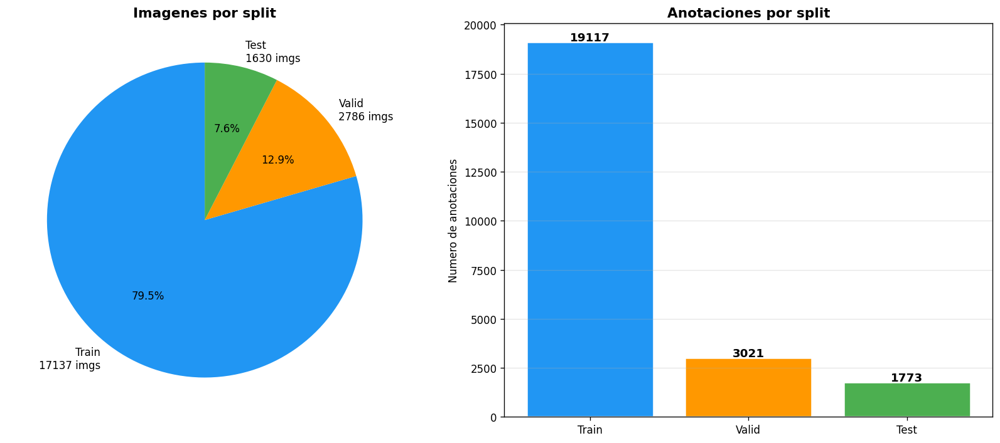

In [14]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6))
img_counts = [len(marcas_files[s]) for s in SPLITS]
labels_pie = [f"{SPLIT_LABELS[s]}\n{c} imgs" for s, c in zip(SPLITS, img_counts)]
colors = [SPLIT_COLORS[s] for s in SPLITS]
axes[0].pie(img_counts, labels=labels_pie, colors=colors, autopct="%1.1f%%", startangle=90, textprops={"fontsize": 10})
axes[0].set_title("Imagenes por split", fontsize=13, fontweight="bold")
annot_counts = [sum(f["num_annotations"] for f in marcas_files[s]) for s in SPLITS]
bars = axes[1].bar([SPLIT_LABELS[s] for s in SPLITS], annot_counts, color=colors, edgecolor="white", linewidth=1.5)
for bar, val in zip(bars, annot_counts):
    axes[1].text(bar.get_x()+bar.get_width()/2, bar.get_height()+50, str(val), ha="center", fontsize=11, fontweight="bold")
axes[1].set_ylabel("Numero de anotaciones"); axes[1].set_title("Anotaciones por split", fontsize=13, fontweight="bold")
axes[1].grid(axis="y", alpha=0.3)
plt.tight_layout()
fig.savefig(MARCAS_GRAFICAS_DIR / "03_distribucion_splits.png", dpi=150, bbox_inches="tight")
plt.show()

## 3.4 Anotaciones por imagen

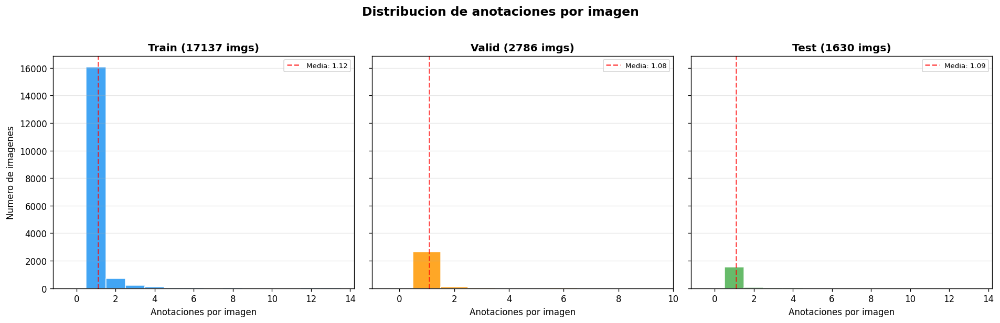

In [15]:
fig, axes = plt.subplots(1, 3, figsize=(16, 5), sharey=True)
for i, split in enumerate(SPLITS):
    counts = [f["num_annotations"] for f in marcas_files[split]]
    axes[i].hist(counts, bins=range(0, max(counts)+2), color=SPLIT_COLORS[split], edgecolor="white", alpha=0.85, align="left")
    axes[i].set_title(f"{SPLIT_LABELS[split]} ({len(counts)} imgs)", fontsize=12, fontweight="bold")
    axes[i].set_xlabel("Anotaciones por imagen")
    if i == 0: axes[i].set_ylabel("Numero de imagenes")
    mean_v = np.mean(counts)
    axes[i].axvline(mean_v, color="red", linestyle="--", alpha=0.7, label=f"Media: {mean_v:.2f}")
    axes[i].legend(fontsize=8); axes[i].grid(axis="y", alpha=0.3)
fig.suptitle("Distribucion de anotaciones por imagen", fontsize=14, fontweight="bold", y=1.02)
plt.tight_layout()
fig.savefig(MARCAS_GRAFICAS_DIR / "04_anotaciones_por_imagen.png", dpi=150, bbox_inches="tight")
plt.show()

## 3.5 Tamano de Bounding Boxes

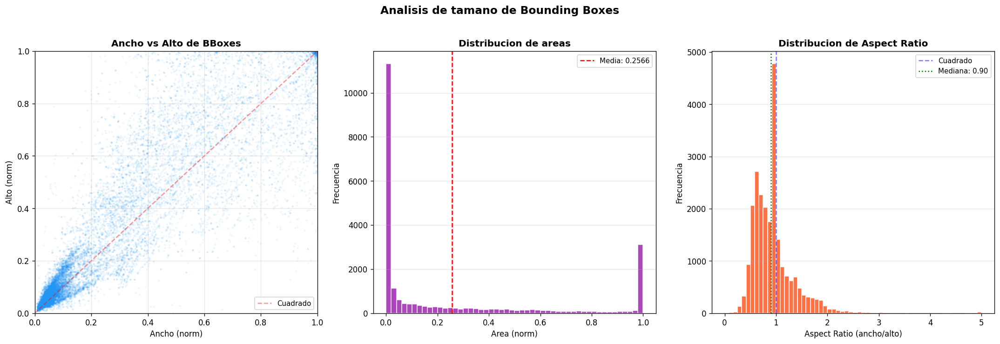

In [16]:
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
widths = [a["width"] for a in marcas_annotations]
heights = [a["height"] for a in marcas_annotations]
areas = [a["width"]*a["height"] for a in marcas_annotations]
aspect_ratios = [a["width"]/max(a["height"],1e-6) for a in marcas_annotations]

axes[0].scatter(widths, heights, alpha=0.05, s=3, c="#2196F3")
axes[0].set_xlabel("Ancho (norm)"); axes[0].set_ylabel("Alto (norm)")
axes[0].set_title("Ancho vs Alto de BBoxes", fontweight="bold")
axes[0].set_xlim(0,1); axes[0].set_ylim(0,1)
axes[0].plot([0,1],[0,1],"r--",alpha=0.4,label="Cuadrado"); axes[0].legend(fontsize=9); axes[0].grid(alpha=0.3)

axes[1].hist(areas, bins=50, color="#9C27B0", edgecolor="white", alpha=0.85)
axes[1].set_xlabel("Area (norm)"); axes[1].set_ylabel("Frecuencia")
axes[1].set_title("Distribucion de areas", fontweight="bold")
axes[1].axvline(np.mean(areas), color="red", linestyle="--", label=f"Media: {np.mean(areas):.4f}")
axes[1].legend(fontsize=9); axes[1].grid(axis="y", alpha=0.3)

ar_clipped = [min(ar, 5) for ar in aspect_ratios]
axes[2].hist(ar_clipped, bins=60, color="#FF5722", edgecolor="white", alpha=0.85)
axes[2].axvline(1.0, color="blue", linestyle="--", alpha=0.5, label="Cuadrado")
axes[2].axvline(np.median(aspect_ratios), color="green", linestyle=":", label=f"Mediana: {np.median(aspect_ratios):.2f}")
axes[2].set_xlabel("Aspect Ratio (ancho/alto)"); axes[2].set_ylabel("Frecuencia")
axes[2].set_title("Distribucion de Aspect Ratio", fontweight="bold")
axes[2].legend(fontsize=9); axes[2].grid(axis="y", alpha=0.3)
fig.suptitle("Analisis de tamano de Bounding Boxes", fontsize=14, fontweight="bold", y=1.02)
plt.tight_layout()
fig.savefig(MARCAS_GRAFICAS_DIR / "05_tamano_bboxes.png", dpi=150, bbox_inches="tight")
plt.show()

## 3.6 Heatmap de centros de BBoxes

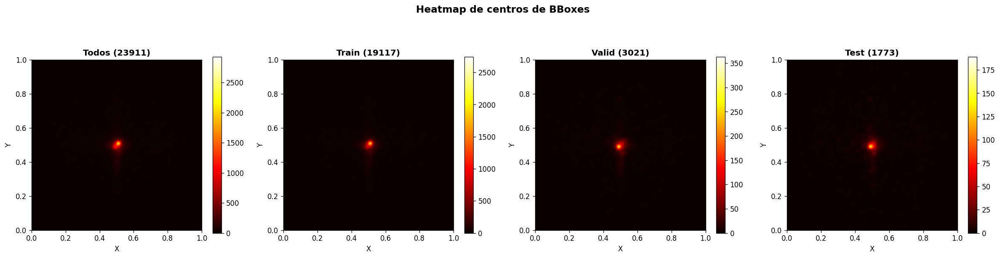

In [17]:
fig, axes = plt.subplots(1, 4, figsize=(20, 5))
titles = ["Todos", "Train", "Valid", "Test"]
filters = [lambda a: True, lambda a: a["split"]=="train", lambda a: a["split"]=="valid", lambda a: a["split"]=="test"]
for ax, title, filt in zip(axes, titles, filters):
    subset = [a for a in marcas_annotations if filt(a)]
    xs = [a["x_center"] for a in subset]; ys = [a["y_center"] for a in subset]
    heatmap, _, _ = np.histogram2d(xs, ys, bins=50, range=[[0,1],[0,1]])
    im = ax.imshow(heatmap.T, origin="lower", cmap="hot", extent=[0,1,0,1], aspect="equal", interpolation="gaussian")
    ax.set_title(f"{title} ({len(subset)})", fontweight="bold"); ax.set_xlabel("X"); ax.set_ylabel("Y")
    plt.colorbar(im, ax=ax, shrink=0.8)
fig.suptitle("Heatmap de centros de BBoxes", fontsize=14, fontweight="bold", y=1.02)
plt.tight_layout()
fig.savefig(MARCAS_GRAFICAS_DIR / "06_heatmap_centros_bbox.png", dpi=150, bbox_inches="tight")
plt.show()

## 3.7 Contribucion de cada dataset fuente por clase

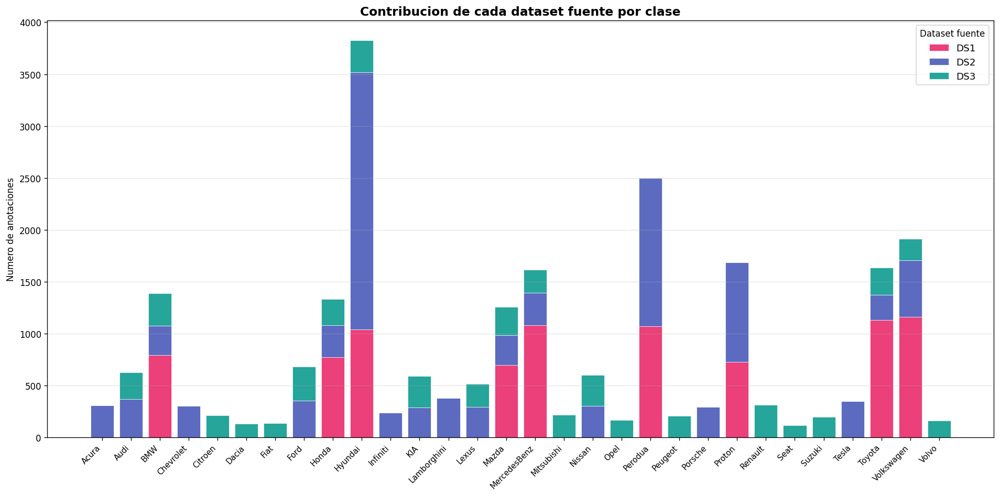

In [18]:
fig, ax = plt.subplots(figsize=(16, 8))
sources = ["DS1", "DS2", "DS3"]
class_source_counts = defaultdict(lambda: defaultdict(int))
for a in marcas_annotations:
    class_source_counts[a["class_id"]][a["source"]] += 1
x = np.arange(len(class_names))
bottom = np.zeros(len(class_names))
for src in sources:
    values = [class_source_counts[c][src] for c in range(len(class_names))]
    ax.bar(x, values, bottom=bottom, label=src, color=SOURCE_COLORS[src], edgecolor="white", linewidth=0.5, alpha=0.85)
    bottom += np.array(values)
ax.set_xticks(x); ax.set_xticklabels(class_names, rotation=45, ha="right", fontsize=9)
ax.set_ylabel("Numero de anotaciones")
ax.set_title("Contribucion de cada dataset fuente por clase", fontsize=14, fontweight="bold")
ax.legend(fontsize=11, title="Dataset fuente"); ax.grid(axis="y", alpha=0.3)
plt.tight_layout()
fig.savefig(MARCAS_GRAFICAS_DIR / "07_contribucion_datasets_fuente.png", dpi=150, bbox_inches="tight")
plt.show()

## 3.8 Analisis de desbalance de clases

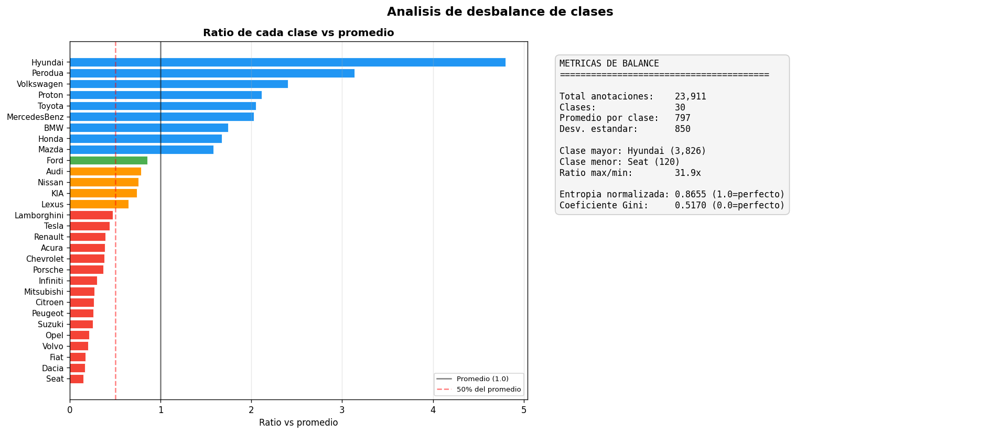

In [19]:
fig, axes = plt.subplots(1, 2, figsize=(16, 7))
counts = Counter(a["class_id"] for a in marcas_annotations)
values = [counts.get(c, 0) for c in range(len(class_names))]
mean_count = np.mean(values)
ratios = [v / mean_count for v in values]

ax = axes[0]
sorted_pairs = sorted(zip(class_names, ratios), key=lambda x: x[1])
names_s, ratios_s = zip(*sorted_pairs)
colors = ["#F44336" if r<0.5 else "#FF9800" if r<0.8 else "#4CAF50" if r<1.5 else "#2196F3" for r in ratios_s]
ax.barh(range(len(names_s)), ratios_s, color=colors, edgecolor="white", linewidth=0.5)
ax.set_yticks(range(len(names_s))); ax.set_yticklabels(names_s, fontsize=9)
ax.axvline(1.0, color="black", linestyle="-", alpha=0.5, label="Promedio (1.0)")
ax.axvline(0.5, color="red", linestyle="--", alpha=0.5, label="50% del promedio")
ax.set_xlabel("Ratio vs promedio"); ax.set_title("Ratio de cada clase vs promedio", fontweight="bold")
ax.legend(fontsize=8, loc="lower right"); ax.grid(axis="x", alpha=0.3)

ax = axes[1]; ax.axis("off")
max_class = class_names[np.argmax(values)]; min_class = class_names[np.argmin(values)]
imbalance_ratio = max(values) / max(min(values), 1)
probs = np.array(values) / sum(values)
entropy = -np.sum(probs * np.log(probs + 1e-10))
norm_entropy = entropy / np.log(len(class_names))
sorted_vals = np.sort(values); n = len(sorted_vals)
gini = (2 * np.sum((np.arange(1,n+1) * sorted_vals))) / (n * np.sum(sorted_vals)) - (n+1)/n
metrics = (f"METRICAS DE BALANCE\n{'='*40}\n\n"
           f"Total anotaciones:    {sum(values):,}\nClases:               {len(class_names)}\n"
           f"Promedio por clase:   {mean_count:,.0f}\nDesv. estandar:       {np.std(values):,.0f}\n\n"
           f"Clase mayor: {max_class} ({max(values):,})\nClase menor: {min_class} ({min(values):,})\n"
           f"Ratio max/min:        {imbalance_ratio:.1f}x\n\n"
           f"Entropia normalizada: {norm_entropy:.4f} (1.0=perfecto)\n"
           f"Coeficiente Gini:     {gini:.4f} (0.0=perfecto)")
ax.text(0.05, 0.95, metrics, transform=ax.transAxes, fontsize=10, va="top", fontfamily="monospace",
        bbox=dict(boxstyle="round,pad=0.5", facecolor="#F5F5F5", edgecolor="#CCCCCC"))
fig.suptitle("Analisis de desbalance de clases", fontsize=14, fontweight="bold")
plt.tight_layout()
fig.savefig(MARCAS_GRAFICAS_DIR / "08_analisis_desbalance.png", dpi=150, bbox_inches="tight")
plt.show()

## 3.9 Area de BBox por clase

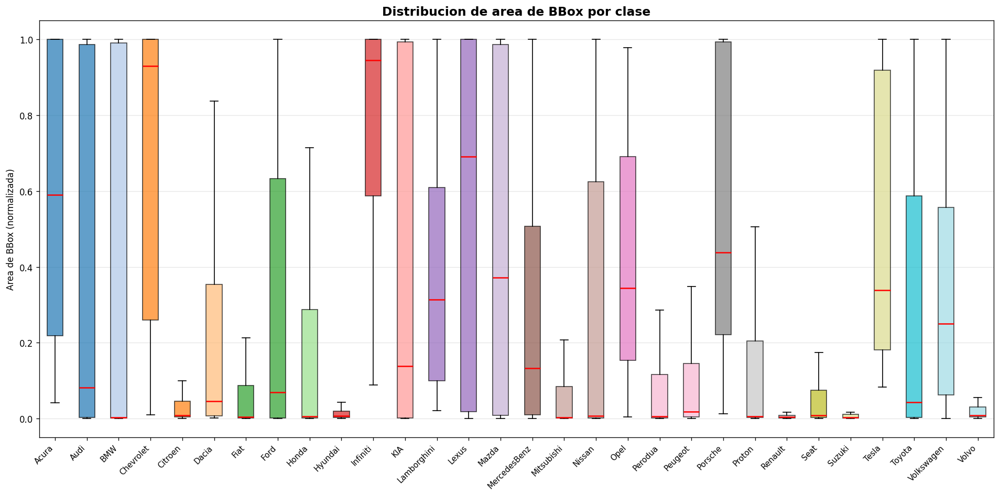

In [20]:
fig, ax = plt.subplots(figsize=(16, 8))
class_areas = defaultdict(list)
for a in marcas_annotations:
    class_areas[a["class_id"]].append(a["width"] * a["height"])
data = [class_areas[c] for c in range(len(class_names))]
bp = ax.boxplot(data, tick_labels=class_names, patch_artist=True, showfliers=False,
                medianprops=dict(color="red", linewidth=1.5))
colors = get_class_colors(len(class_names))
for patch, color in zip(bp["boxes"], colors):
    patch.set_facecolor(color); patch.set_alpha(0.7)
ax.set_xticklabels(class_names, rotation=45, ha="right", fontsize=9)
ax.set_ylabel("Area de BBox (normalizada)")
ax.set_title("Distribucion de area de BBox por clase", fontsize=14, fontweight="bold")
ax.grid(axis="y", alpha=0.3)
plt.tight_layout()
fig.savefig(MARCAS_GRAFICAS_DIR / "09_area_bbox_por_clase.png", dpi=150, bbox_inches="tight")
plt.show()

## 3.10 Consistencia de distribuciones entre splits

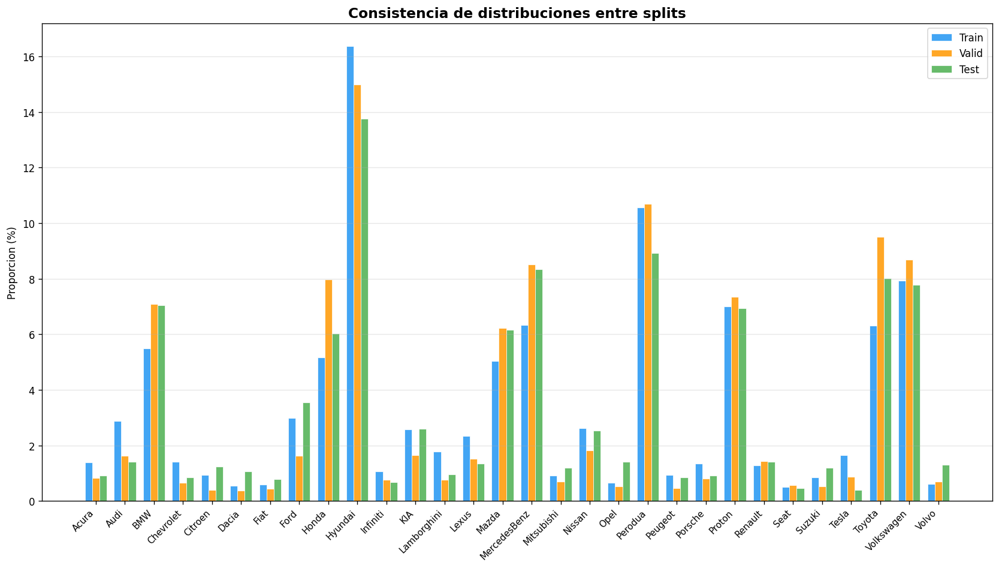

In [21]:
fig, ax = plt.subplots(figsize=(14, 8))
split_proportions = {}
for split in SPLITS:
    subset = [a for a in marcas_annotations if a["split"] == split]
    total = len(subset)
    c = Counter(a["class_id"] for a in subset)
    split_proportions[split] = [c.get(i,0)/total*100 for i in range(len(class_names))]
x = np.arange(len(class_names)); width = 0.25
for i, split in enumerate(SPLITS):
    ax.bar(x+(i-1)*width, split_proportions[split], width, label=SPLIT_LABELS[split],
           color=SPLIT_COLORS[split], alpha=0.85, edgecolor="white", linewidth=0.5)
ax.set_xticks(x); ax.set_xticklabels(class_names, rotation=45, ha="right", fontsize=9)
ax.set_ylabel("Proporcion (%)"); ax.set_title("Consistencia de distribuciones entre splits", fontsize=14, fontweight="bold")
ax.legend(); ax.grid(axis="y", alpha=0.3)
plt.tight_layout()
fig.savefig(MARCAS_GRAFICAS_DIR / "10_consistencia_splits.png", dpi=150, bbox_inches="tight")
plt.show()

## 3.11 Imagenes por dataset fuente en cada split

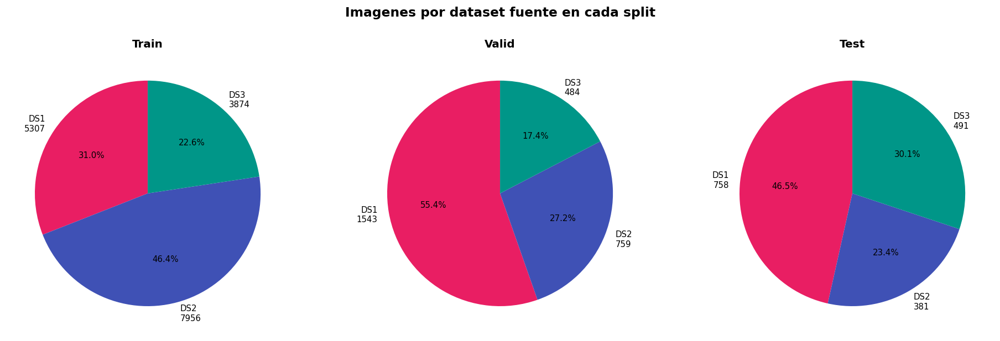

In [22]:
fig, axes = plt.subplots(1, 3, figsize=(16, 5))
for i, split in enumerate(SPLITS):
    source_counts = Counter()
    for f in marcas_files[split]:
        fname = f["file"]
        src = "DS1" if fname.startswith("ds1_") else "DS2" if fname.startswith("ds2_") else "DS3" if fname.startswith("ds3_") else "Desconocido"
        source_counts[src] += 1
    sources_s = sorted(source_counts.keys())
    vals = [source_counts[s] for s in sources_s]
    colors = [SOURCE_COLORS[s] for s in sources_s]
    axes[i].pie(vals, labels=[f"{s}\n{v}" for s,v in zip(sources_s,vals)], colors=colors,
                autopct="%1.1f%%", startangle=90, textprops={"fontsize": 9})
    axes[i].set_title(SPLIT_LABELS[split], fontsize=12, fontweight="bold")
fig.suptitle("Imagenes por dataset fuente en cada split", fontsize=14, fontweight="bold", y=1.02)
plt.tight_layout()
fig.savefig(MARCAS_GRAFICAS_DIR / "11_fuentes_por_split.png", dpi=150, bbox_inches="tight")
plt.show()

## 3.12 Matriz de co-ocurrencia de clases

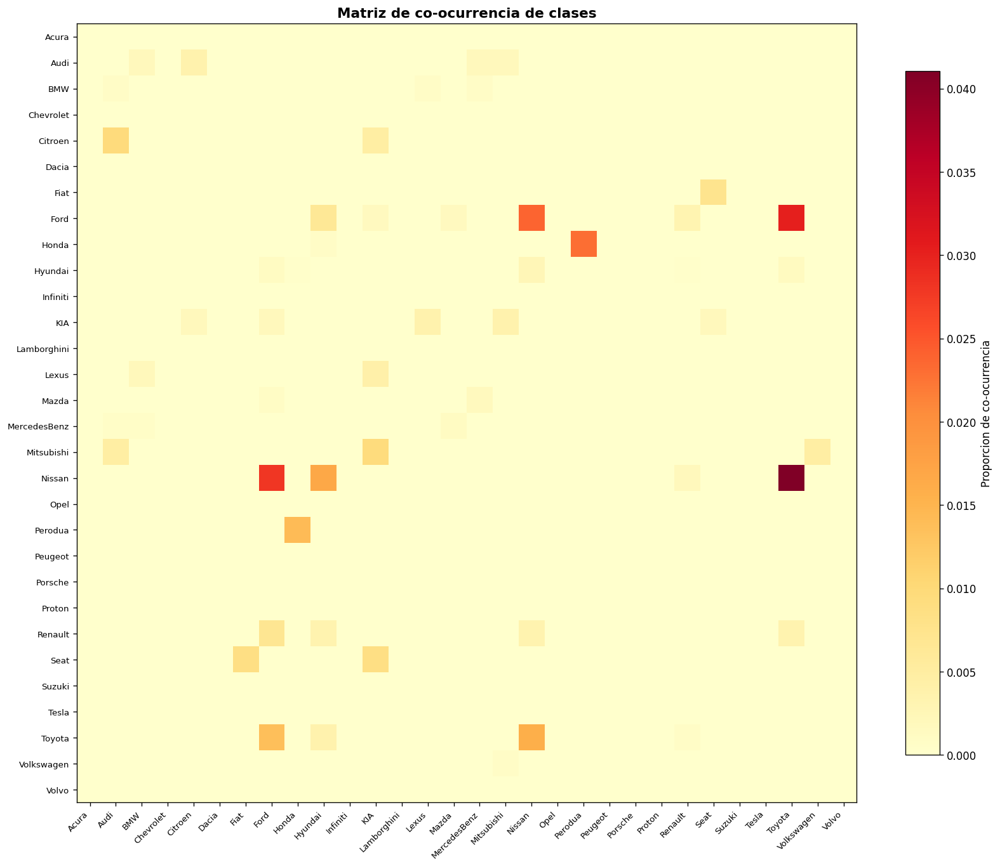

In [23]:
n_classes = len(class_names)
cooccurrence = np.zeros((n_classes, n_classes), dtype=int)
for split in SPLITS:
    for f in marcas_files[split]:
        unique_classes = list(set(f["classes"]))
        for ci in range(len(unique_classes)):
            for cj in range(len(unique_classes)):
                cooccurrence[unique_classes[ci]][unique_classes[cj]] += 1

fig, ax = plt.subplots(figsize=(14, 12))
off_diag_sum = np.sum(cooccurrence) - np.trace(cooccurrence)
if off_diag_sum > 0:
    diag = np.diag(cooccurrence).astype(float); diag[diag==0] = 1
    cooc_norm = cooccurrence / diag[:, np.newaxis]
    np.fill_diagonal(cooc_norm, 0)
    im = ax.imshow(cooc_norm, cmap="YlOrRd", aspect="equal")
    ax.set_xticks(range(n_classes)); ax.set_yticks(range(n_classes))
    ax.set_xticklabels(class_names, rotation=45, ha="right", fontsize=8)
    ax.set_yticklabels(class_names, fontsize=8)
    plt.colorbar(im, ax=ax, shrink=0.8, label="Proporcion de co-ocurrencia")
else:
    ax.text(0.5, 0.5, "No hay co-ocurrencia significativa", transform=ax.transAxes, ha="center", va="center", fontsize=14)
ax.set_title("Matriz de co-ocurrencia de clases", fontsize=13, fontweight="bold")
plt.tight_layout()
fig.savefig(MARCAS_GRAFICAS_DIR / "12_coocurrencia_clases.png", dpi=150, bbox_inches="tight")
plt.show()

## 3.13 Posicion promedio del centro de BBox por clase

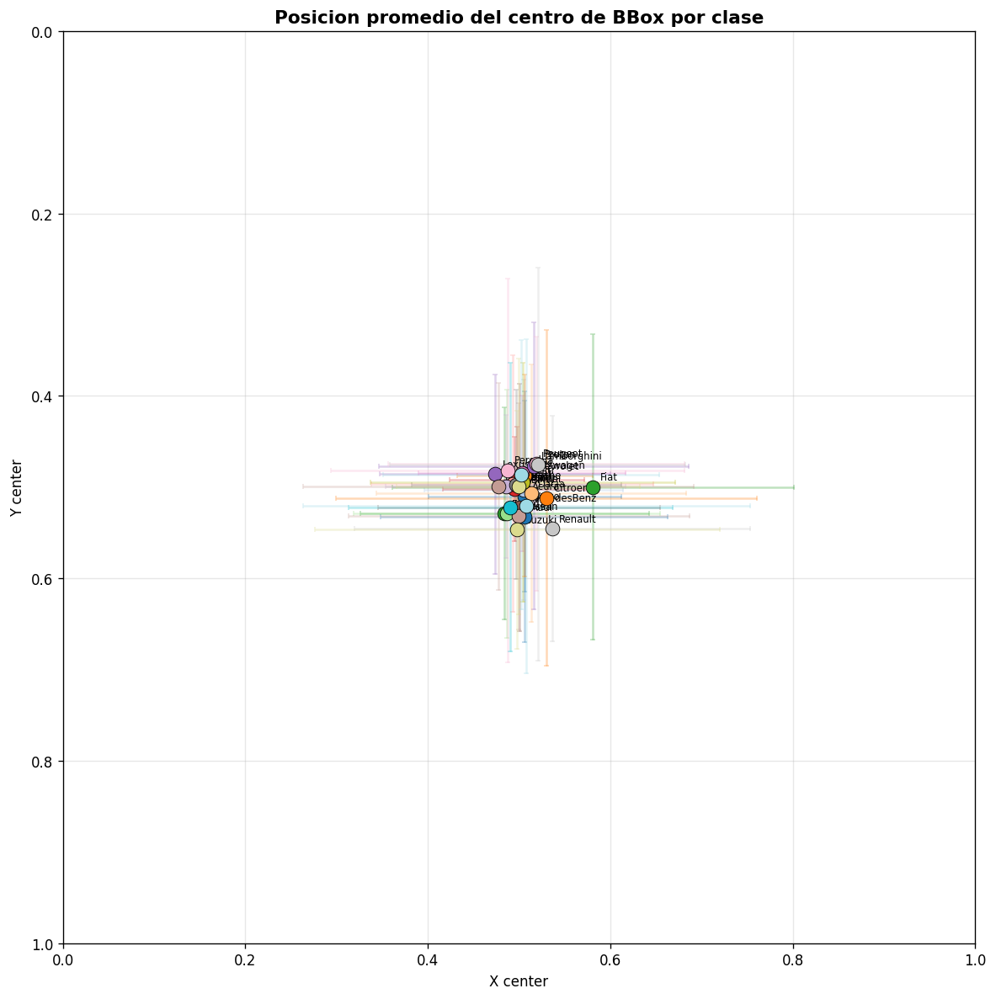

In [24]:
fig, ax = plt.subplots(figsize=(12, 10))
class_positions = defaultdict(lambda: {"x": [], "y": []})
for a in marcas_annotations:
    class_positions[a["class_id"]]["x"].append(a["x_center"])
    class_positions[a["class_id"]]["y"].append(a["y_center"])
colors = get_class_colors(len(class_names))
for c in range(len(class_names)):
    if class_positions[c]["x"]:
        mx, my = np.mean(class_positions[c]["x"]), np.mean(class_positions[c]["y"])
        sx, sy = np.std(class_positions[c]["x"]), np.std(class_positions[c]["y"])
        ax.scatter(mx, my, s=100, color=colors[c], zorder=5, edgecolors="black", linewidths=0.5)
        ax.errorbar(mx, my, xerr=sx, yerr=sy, fmt="none", color=colors[c], alpha=0.3, capsize=2)
        ax.annotate(class_names[c], (mx, my), fontsize=7, textcoords="offset points", xytext=(5,5))
ax.set_xlim(0,1); ax.set_ylim(0,1); ax.invert_yaxis()
ax.set_xlabel("X center"); ax.set_ylabel("Y center")
ax.set_title("Posicion promedio del centro de BBox por clase", fontsize=13, fontweight="bold")
ax.set_aspect("equal"); ax.grid(alpha=0.3)
plt.tight_layout()
fig.savefig(MARCAS_GRAFICAS_DIR / "13_posicion_centro_por_clase.png", dpi=150, bbox_inches="tight")
plt.show()

## 3.14 Ejemplo de imagen por clase

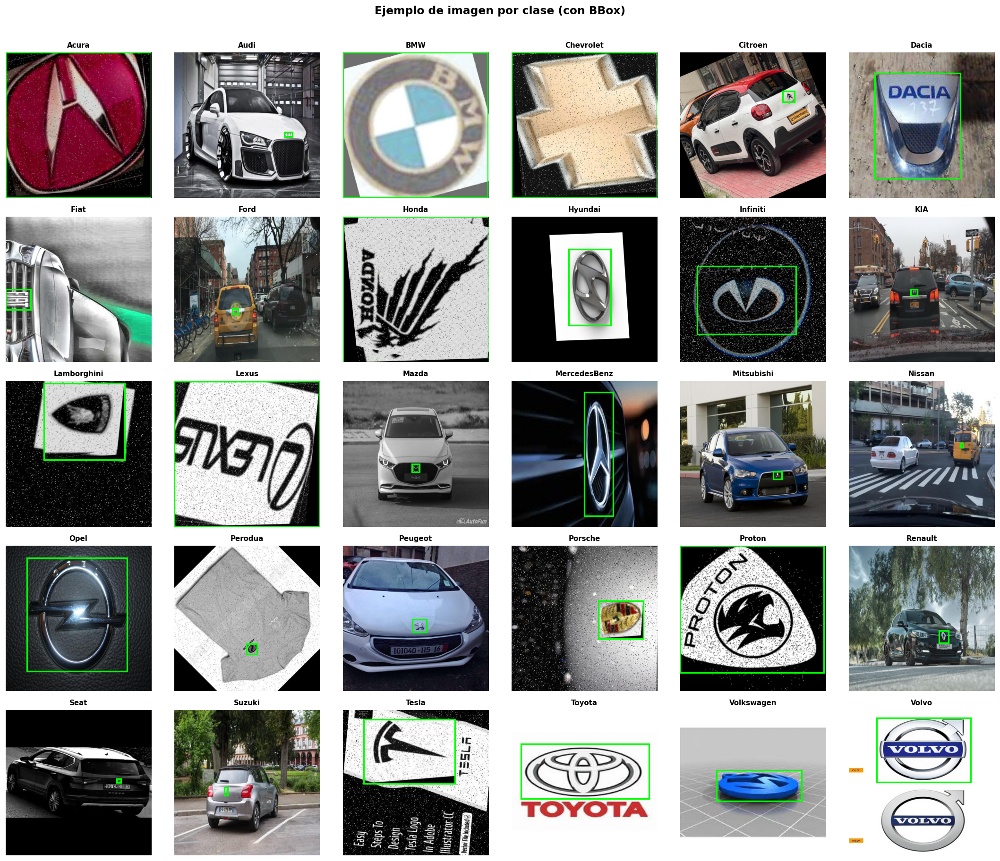

In [25]:
fig, axes = plt.subplots(5, 6, figsize=(18, 15))
axes_flat = axes.flatten()
images_dir = MARCAS_OUTPUT_DIR / "train" / "images"
labels_dir = MARCAS_OUTPUT_DIR / "train" / "labels"
class_examples = {c: None for c in range(len(class_names))}
label_files = list(labels_dir.glob("*.txt"))
random.seed(42); random.shuffle(label_files)
for lf in label_files:
    if all(v is not None for v in class_examples.values()): break
    with open(lf, "r") as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) >= 5:
                cls_id = int(parts[0])
                if class_examples[cls_id] is None:
                    for ext in [".jpg",".jpeg",".png",".bmp"]:
                        img_path = images_dir / (lf.stem + ext)
                        if img_path.exists():
                            class_examples[cls_id] = (img_path, float(parts[1]), float(parts[2]), float(parts[3]), float(parts[4]))
                            break
for c in range(len(class_names)):
    ax = axes_flat[c]
    if class_examples[c] is not None:
        img_path, xc, yc, w, h = class_examples[c]
        try:
            img = Image.open(img_path); img_w, img_h = img.size; ax.imshow(img)
            rect = plt.Rectangle(((xc-w/2)*img_w, (yc-h/2)*img_h), w*img_w, h*img_h, linewidth=2, edgecolor="lime", facecolor="none")
            ax.add_patch(rect)
        except: ax.text(0.5,0.5,"Error",ha="center",va="center",transform=ax.transAxes)
    else: ax.text(0.5,0.5,"Sin ejemplo",ha="center",va="center",transform=ax.transAxes)
    ax.set_title(class_names[c], fontsize=9, fontweight="bold"); ax.axis("off")
fig.suptitle("Ejemplo de imagen por clase (con BBox)", fontsize=14, fontweight="bold", y=1.01)
plt.tight_layout()
fig.savefig(MARCAS_GRAFICAS_DIR / "14_ejemplos_por_clase.png", dpi=150, bbox_inches="tight")
plt.show()

## 3.15 Dashboard resumen - Dataset de Marcas

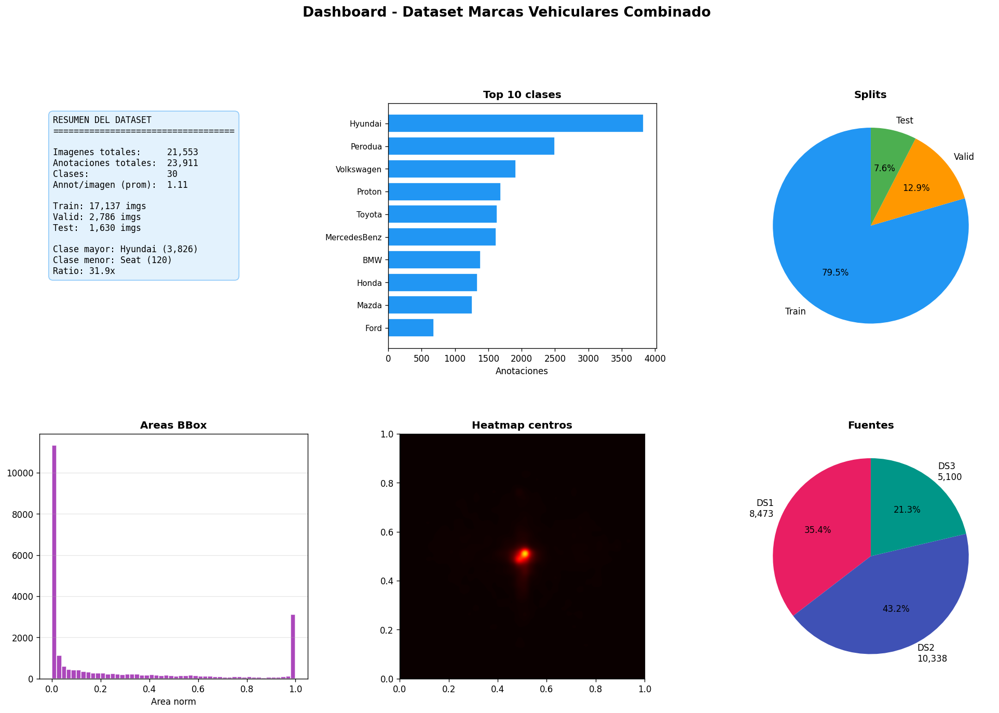

In [26]:
fig = plt.figure(figsize=(20, 12))
gs = gridspec.GridSpec(2, 3, figure=fig, hspace=0.35, wspace=0.3)
total_imgs = sum(len(marcas_files[s]) for s in SPLITS)
total_annots = len(marcas_annotations)
counts = Counter(a["class_id"] for a in marcas_annotations)
values = list(counts.values())

ax = fig.add_subplot(gs[0,0]); ax.axis("off")
kpi = (f"RESUMEN DEL DATASET\n{'='*35}\n\nImagenes totales:     {total_imgs:,}\n"
       f"Anotaciones totales:  {total_annots:,}\nClases:               {len(class_names)}\n"
       f"Annot/imagen (prom):  {total_annots/total_imgs:.2f}\n\n"
       f"Train: {len(marcas_files['train']):,} imgs\nValid: {len(marcas_files['valid']):,} imgs\n"
       f"Test:  {len(marcas_files['test']):,} imgs\n\n"
       f"Clase mayor: {class_names[max(counts,key=counts.get)]} ({max(values):,})\n"
       f"Clase menor: {class_names[min(counts,key=counts.get)]} ({min(values):,})\n"
       f"Ratio: {max(values)/min(values):.1f}x")
ax.text(0.05,0.95,kpi,transform=ax.transAxes,fontsize=10,va="top",fontfamily="monospace",
        bbox=dict(boxstyle="round,pad=0.5",facecolor="#E3F2FD",edgecolor="#90CAF9"))

ax = fig.add_subplot(gs[0,1])
top10 = counts.most_common(10)
ax.barh(range(len(top10)), [v for _,v in top10], color="#2196F3", edgecolor="white")
ax.set_yticks(range(len(top10))); ax.set_yticklabels([class_names[c] for c,_ in top10], fontsize=9)
ax.invert_yaxis(); ax.set_title("Top 10 clases", fontweight="bold"); ax.set_xlabel("Anotaciones")

ax = fig.add_subplot(gs[0,2])
ax.pie([len(marcas_files[s]) for s in SPLITS], labels=[SPLIT_LABELS[s] for s in SPLITS],
       colors=[SPLIT_COLORS[s] for s in SPLITS], autopct="%1.1f%%", startangle=90)
ax.set_title("Splits", fontweight="bold")

ax = fig.add_subplot(gs[1,0])
ax.hist([a["width"]*a["height"] for a in marcas_annotations], bins=50, color="#9C27B0", edgecolor="white", alpha=0.85)
ax.set_title("Areas BBox", fontweight="bold"); ax.set_xlabel("Area norm"); ax.grid(axis="y",alpha=0.3)

ax = fig.add_subplot(gs[1,1])
xs=[a["x_center"] for a in marcas_annotations]; ys=[a["y_center"] for a in marcas_annotations]
hm,_,_=np.histogram2d(xs,ys,bins=40,range=[[0,1],[0,1]])
ax.imshow(hm.T,origin="lower",cmap="hot",extent=[0,1,0,1],aspect="equal",interpolation="gaussian")
ax.set_title("Heatmap centros", fontweight="bold")

ax = fig.add_subplot(gs[1,2])
src_counts = Counter(a["source"] for a in marcas_annotations); srcs = sorted(src_counts.keys())
ax.pie([src_counts[s] for s in srcs], labels=[f"{s}\n{src_counts[s]:,}" for s in srcs],
       colors=[SOURCE_COLORS.get(s,"#9E9E9E") for s in srcs], autopct="%1.1f%%", startangle=90)
ax.set_title("Fuentes", fontweight="bold")

fig.suptitle("Dashboard - Dataset Marcas Vehiculares Combinado", fontsize=16, fontweight="bold", y=1.01)
fig.savefig(MARCAS_GRAFICAS_DIR / "15_dashboard_resumen.png", dpi=150, bbox_inches="tight")
plt.show()

---
# PARTE 4: Analisis del Dataset de Placas Vehiculares
*Script original: `scripts/08_analisis_dataset_placas.py`*

13 graficas enfocadas en la distribucion espacial, tamano y diversidad de las anotaciones de placas (1 sola clase).

In [27]:
# --- Carga de datos del dataset de placas ---
PLACAS_GRAFICAS_DIR = PROJECT_DIR / "graficas_dataset_placas"
PLACAS_GRAFICAS_DIR.mkdir(exist_ok=True)

placas_config_path = PLACAS_OUTPUT_DIR / "data.yaml"
with open(placas_config_path, "r", encoding="utf-8") as f:
    placas_config = yaml.safe_load(f)

placas_annotations = []
placas_files = {}
for split in SPLITS:
    annots, files = parse_labels(PLACAS_OUTPUT_DIR, split)
    placas_annotations.extend(annots)
    placas_files[split] = files
    print(f"  {split}: {len(annots)} anotaciones, {len(files)} imagenes")
print(f"  TOTAL: {len(placas_annotations)} anotaciones en {sum(len(placas_files[s]) for s in SPLITS)} imagenes")

  train: 985 anotaciones, 975 imagenes
  valid: 174 anotaciones, 174 imagenes
  test: 63 anotaciones, 63 imagenes
  TOTAL: 1222 anotaciones en 1212 imagenes


## 4.1 Distribucion de splits

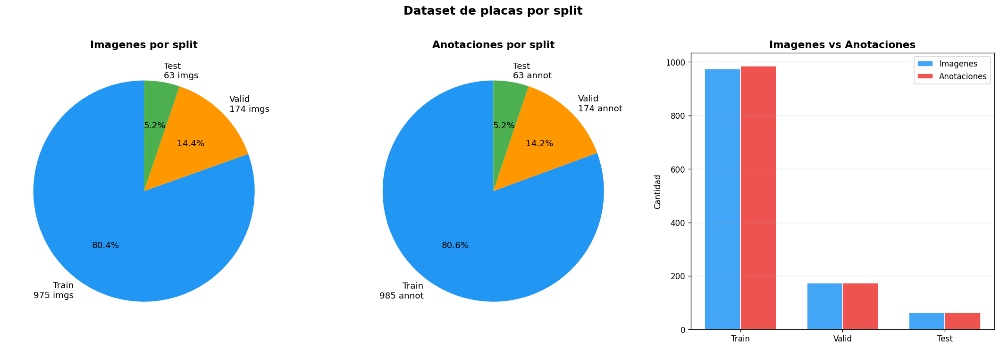

In [28]:
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
img_counts = [len(placas_files[s]) for s in SPLITS]
colors = [SPLIT_COLORS[s] for s in SPLITS]
axes[0].pie(img_counts, labels=[f"{SPLIT_LABELS[s]}\n{c} imgs" for s,c in zip(SPLITS,img_counts)],
            colors=colors, autopct="%1.1f%%", startangle=90, textprops={"fontsize": 11})
axes[0].set_title("Imagenes por split", fontsize=13, fontweight="bold")

annot_counts = [len([a for a in placas_annotations if a["split"]==s]) for s in SPLITS]
axes[1].pie(annot_counts, labels=[f"{SPLIT_LABELS[s]}\n{c} annot" for s,c in zip(SPLITS,annot_counts)],
            colors=colors, autopct="%1.1f%%", startangle=90, textprops={"fontsize": 11})
axes[1].set_title("Anotaciones por split", fontsize=13, fontweight="bold")

x = np.arange(len(SPLITS)); w = 0.35
axes[2].bar(x-w/2, img_counts, w, label="Imagenes", color="#42A5F5", edgecolor="white")
axes[2].bar(x+w/2, annot_counts, w, label="Anotaciones", color="#EF5350", edgecolor="white")
axes[2].set_xticks(x); axes[2].set_xticklabels([SPLIT_LABELS[s] for s in SPLITS])
axes[2].set_ylabel("Cantidad"); axes[2].set_title("Imagenes vs Anotaciones", fontsize=13, fontweight="bold")
axes[2].legend(); axes[2].grid(axis="y", alpha=0.3)
fig.suptitle("Dataset de placas por split", fontsize=15, fontweight="bold", y=1.02)
plt.tight_layout()
fig.savefig(PLACAS_GRAFICAS_DIR / "01_distribucion_splits.png", dpi=150, bbox_inches="tight")
plt.show()

## 4.2 Placas por imagen

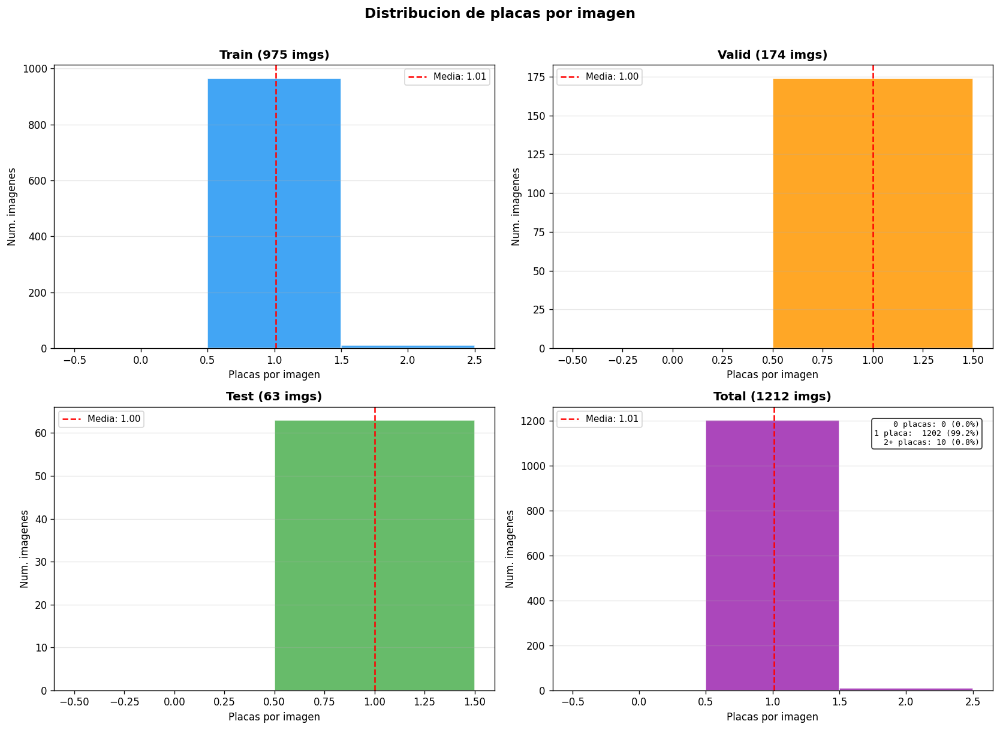

In [29]:
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
for i, split in enumerate(SPLITS):
    ax = axes[i//2][i%2]
    counts = [f["num_annotations"] for f in placas_files[split]]
    ax.hist(counts, bins=range(0,max(counts)+2), color=SPLIT_COLORS[split], edgecolor="white", alpha=0.85, align="left")
    ax.set_title(f"{SPLIT_LABELS[split]} ({len(counts)} imgs)", fontweight="bold")
    ax.set_xlabel("Placas por imagen"); ax.set_ylabel("Num. imagenes")
    ax.axvline(np.mean(counts), color="red", linestyle="--", label=f"Media: {np.mean(counts):.2f}")
    ax.legend(fontsize=9); ax.grid(axis="y", alpha=0.3)

ax = axes[1][1]
all_counts = []
for s in SPLITS: all_counts.extend([f["num_annotations"] for f in placas_files[s]])
ax.hist(all_counts, bins=range(0,max(all_counts)+2), color="#9C27B0", edgecolor="white", alpha=0.85, align="left")
ax.set_title(f"Total ({len(all_counts)} imgs)", fontweight="bold")
ax.set_xlabel("Placas por imagen"); ax.set_ylabel("Num. imagenes")
ax.axvline(np.mean(all_counts), color="red", linestyle="--", label=f"Media: {np.mean(all_counts):.2f}")
c0=sum(1 for c in all_counts if c==0); c1=sum(1 for c in all_counts if c==1); c2p=sum(1 for c in all_counts if c>=2)
ax.text(0.97,0.95, f"0 placas: {c0} ({c0/len(all_counts)*100:.1f}%)\n1 placa:  {c1} ({c1/len(all_counts)*100:.1f}%)\n2+ placas: {c2p} ({c2p/len(all_counts)*100:.1f}%)",
        transform=ax.transAxes, fontsize=8, va="top", ha="right", fontfamily="monospace",
        bbox=dict(boxstyle="round", facecolor="white", alpha=0.8))
ax.legend(fontsize=9); ax.grid(axis="y", alpha=0.3)
fig.suptitle("Distribucion de placas por imagen", fontsize=14, fontweight="bold", y=1.01)
plt.tight_layout()
fig.savefig(PLACAS_GRAFICAS_DIR / "02_placas_por_imagen.png", dpi=150, bbox_inches="tight")
plt.show()

## 4.3 Tamano de BBoxes de placas

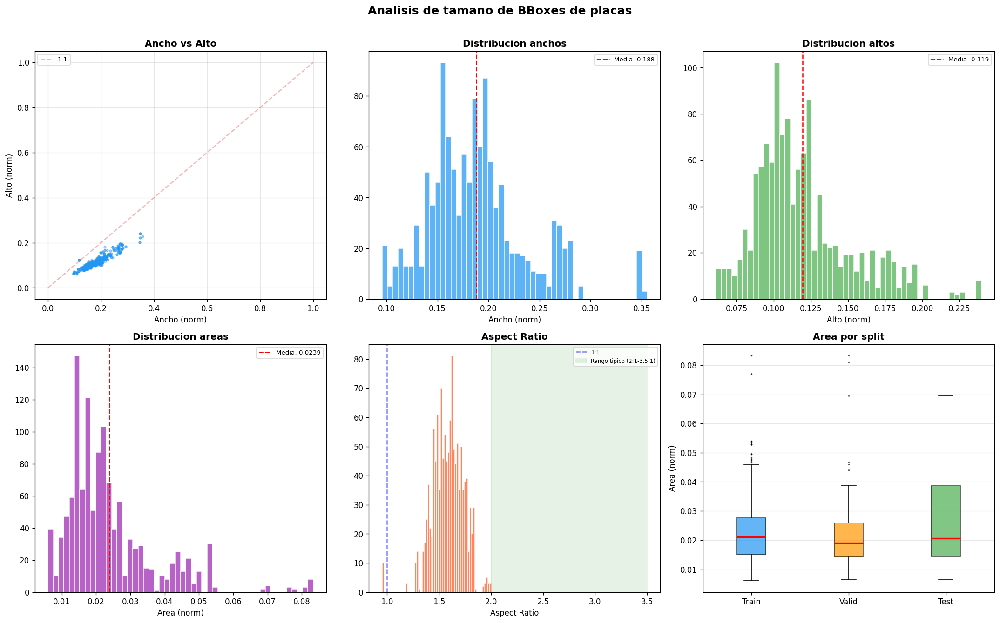

In [30]:
fig, axes = plt.subplots(2, 3, figsize=(18, 11))
pw = np.array([a["width"] for a in placas_annotations])
ph = np.array([a["height"] for a in placas_annotations])
pa = pw * ph; par = pw / np.maximum(ph, 1e-6)

axes[0][0].scatter(pw, ph, alpha=0.15, s=8, c="#2196F3")
axes[0][0].set_xlabel("Ancho (norm)"); axes[0][0].set_ylabel("Alto (norm)")
axes[0][0].set_title("Ancho vs Alto", fontweight="bold")
axes[0][0].plot([0,1],[0,1],"r--",alpha=0.3,label="1:1"); axes[0][0].legend(fontsize=8); axes[0][0].grid(alpha=0.3)

axes[0][1].hist(pw, bins=50, color="#42A5F5", edgecolor="white", alpha=0.85)
axes[0][1].axvline(np.mean(pw), color="red", linestyle="--", label=f"Media: {np.mean(pw):.3f}")
axes[0][1].set_xlabel("Ancho (norm)"); axes[0][1].set_title("Distribucion anchos", fontweight="bold"); axes[0][1].legend(fontsize=8)

axes[0][2].hist(ph, bins=50, color="#66BB6A", edgecolor="white", alpha=0.85)
axes[0][2].axvline(np.mean(ph), color="red", linestyle="--", label=f"Media: {np.mean(ph):.3f}")
axes[0][2].set_xlabel("Alto (norm)"); axes[0][2].set_title("Distribucion altos", fontweight="bold"); axes[0][2].legend(fontsize=8)

axes[1][0].hist(pa, bins=50, color="#AB47BC", edgecolor="white", alpha=0.85)
axes[1][0].axvline(np.mean(pa), color="red", linestyle="--", label=f"Media: {np.mean(pa):.4f}")
axes[1][0].set_xlabel("Area (norm)"); axes[1][0].set_title("Distribucion areas", fontweight="bold"); axes[1][0].legend(fontsize=8)

ar_clipped = np.clip(par, 0, 8)
axes[1][1].hist(ar_clipped, bins=60, color="#FF7043", edgecolor="white", alpha=0.85)
axes[1][1].axvline(1.0, color="blue", linestyle="--", alpha=0.5, label="1:1")
axes[1][1].axvspan(2.0, 3.5, alpha=0.1, color="green", label="Rango tipico (2:1-3.5:1)")
axes[1][1].set_xlabel("Aspect Ratio"); axes[1][1].set_title("Aspect Ratio", fontweight="bold"); axes[1][1].legend(fontsize=7)

split_areas = [[a["width"]*a["height"] for a in placas_annotations if a["split"]==s] for s in SPLITS]
bp = axes[1][2].boxplot(split_areas, tick_labels=[SPLIT_LABELS[s] for s in SPLITS], patch_artist=True,
                        showfliers=True, flierprops=dict(marker=".",markersize=2,alpha=0.3), medianprops=dict(color="red",linewidth=2))
for patch, split in zip(bp["boxes"], SPLITS): patch.set_facecolor(SPLIT_COLORS[split]); patch.set_alpha(0.7)
axes[1][2].set_ylabel("Area (norm)"); axes[1][2].set_title("Area por split", fontweight="bold"); axes[1][2].grid(axis="y",alpha=0.3)

fig.suptitle("Analisis de tamano de BBoxes de placas", fontsize=15, fontweight="bold", y=1.01)
plt.tight_layout()
fig.savefig(PLACAS_GRAFICAS_DIR / "03_tamano_bboxes_placas.png", dpi=150, bbox_inches="tight")
plt.show()

## 4.4 Heatmap de centros de placas

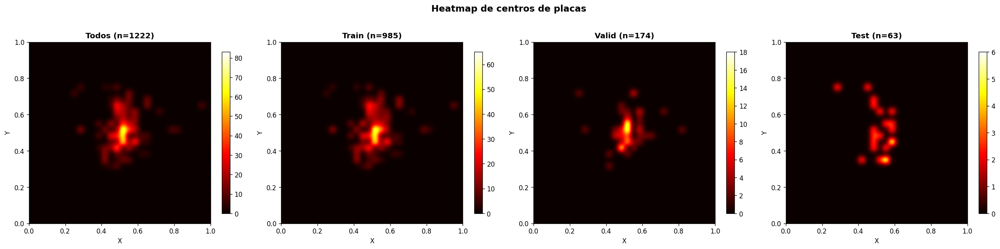

In [31]:
fig, axes = plt.subplots(1, 4, figsize=(22, 5))
titles = ["Todos", "Train", "Valid", "Test"]
filters = [lambda a: True, lambda a: a["split"]=="train", lambda a: a["split"]=="valid", lambda a: a["split"]=="test"]
for ax, title, filt in zip(axes, titles, filters):
    subset = [a for a in placas_annotations if filt(a)]
    xs = [a["x_center"] for a in subset]; ys = [a["y_center"] for a in subset]
    hm, _, _ = np.histogram2d(xs, ys, bins=30, range=[[0,1],[0,1]])
    im = ax.imshow(hm.T, origin="lower", cmap="hot", extent=[0,1,0,1], aspect="equal", interpolation="gaussian")
    ax.set_title(f"{title} (n={len(subset)})", fontweight="bold"); ax.set_xlabel("X"); ax.set_ylabel("Y")
    plt.colorbar(im, ax=ax, shrink=0.8)
fig.suptitle("Heatmap de centros de placas", fontsize=14, fontweight="bold", y=1.02)
plt.tight_layout()
fig.savefig(PLACAS_GRAFICAS_DIR / "04_heatmap_centros_placas.png", dpi=150, bbox_inches="tight")
plt.show()

## 4.5 Distribucion espacial de centros

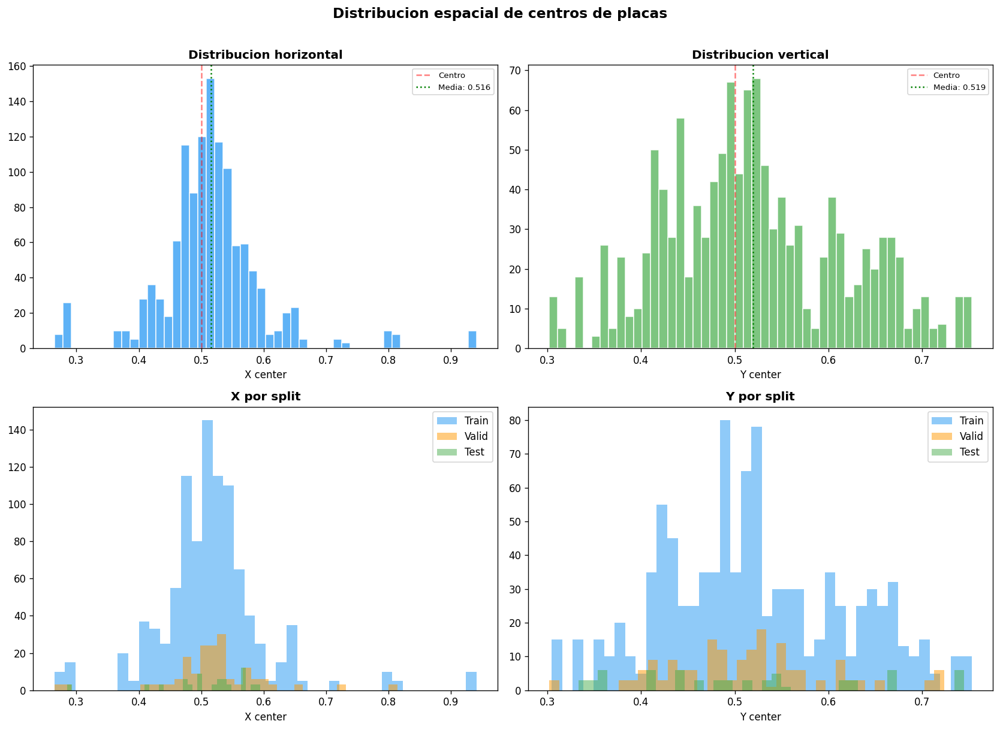

In [32]:
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
pxs = [a["x_center"] for a in placas_annotations]; pys = [a["y_center"] for a in placas_annotations]

axes[0][0].hist(pxs, bins=50, color="#42A5F5", edgecolor="white", alpha=0.85)
axes[0][0].axvline(0.5, color="red", linestyle="--", alpha=0.5, label="Centro")
axes[0][0].axvline(np.mean(pxs), color="green", linestyle=":", label=f"Media: {np.mean(pxs):.3f}")
axes[0][0].set_xlabel("X center"); axes[0][0].set_title("Distribucion horizontal", fontweight="bold"); axes[0][0].legend(fontsize=8)

axes[0][1].hist(pys, bins=50, color="#66BB6A", edgecolor="white", alpha=0.85)
axes[0][1].axvline(0.5, color="red", linestyle="--", alpha=0.5, label="Centro")
axes[0][1].axvline(np.mean(pys), color="green", linestyle=":", label=f"Media: {np.mean(pys):.3f}")
axes[0][1].set_xlabel("Y center"); axes[0][1].set_title("Distribucion vertical", fontweight="bold"); axes[0][1].legend(fontsize=8)

for split in SPLITS:
    axes[1][0].hist([a["x_center"] for a in placas_annotations if a["split"]==split], bins=40, alpha=0.5, label=SPLIT_LABELS[split], color=SPLIT_COLORS[split])
axes[1][0].set_xlabel("X center"); axes[1][0].set_title("X por split", fontweight="bold"); axes[1][0].legend()

for split in SPLITS:
    axes[1][1].hist([a["y_center"] for a in placas_annotations if a["split"]==split], bins=40, alpha=0.5, label=SPLIT_LABELS[split], color=SPLIT_COLORS[split])
axes[1][1].set_xlabel("Y center"); axes[1][1].set_title("Y por split", fontweight="bold"); axes[1][1].legend()

fig.suptitle("Distribucion espacial de centros de placas", fontsize=14, fontweight="bold", y=1.01)
plt.tight_layout()
fig.savefig(PLACAS_GRAFICAS_DIR / "05_distribucion_posicion_centros.png", dpi=150, bbox_inches="tight")
plt.show()

## 4.6 Analisis de datasets fuente

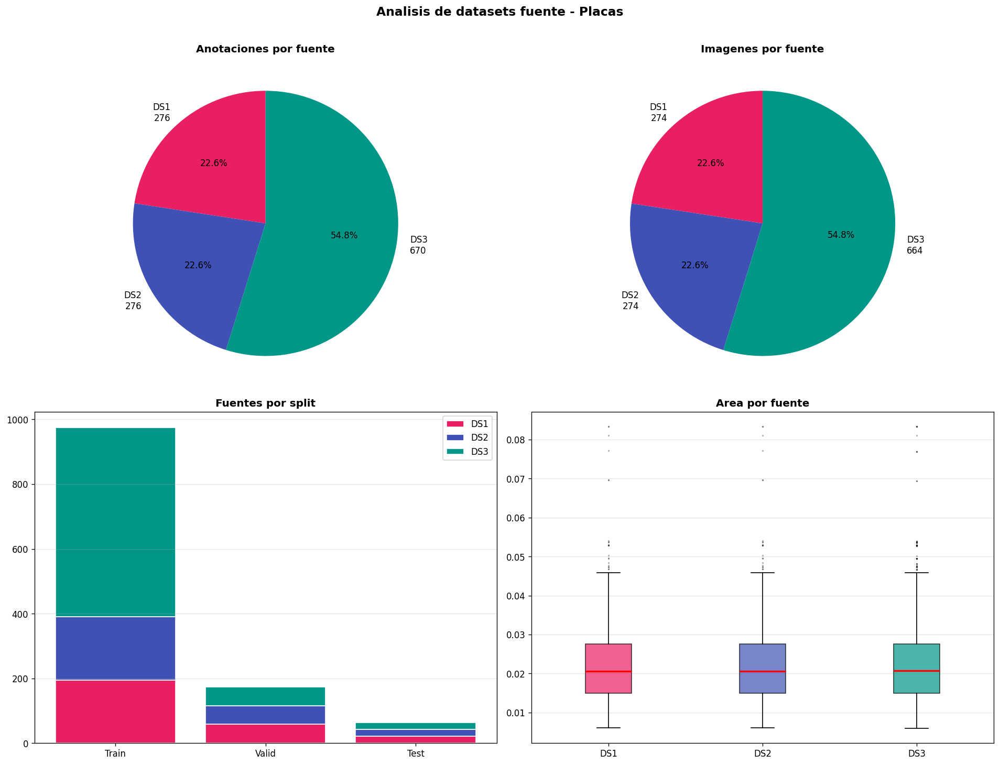

In [33]:
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

src_annot = Counter(a["source"] for a in placas_annotations)
srcs = sorted(src_annot.keys()); vals = [src_annot[s] for s in srcs]
axes[0][0].pie(vals, labels=[f"{s}\n{v}" for s,v in zip(srcs,vals)], colors=[SOURCE_COLORS.get(s,"#9E9E9E") for s in srcs],
               autopct="%1.1f%%", startangle=90); axes[0][0].set_title("Anotaciones por fuente", fontweight="bold")

src_imgs = Counter()
for split in SPLITS:
    for f in placas_files[split]:
        src = "DS1" if f["file"].startswith("ds1_") else "DS2" if f["file"].startswith("ds2_") else "DS3" if f["file"].startswith("ds3_") else "Desconocido"
        src_imgs[src] += 1
srcs_i = sorted(src_imgs.keys()); vals_i = [src_imgs[s] for s in srcs_i]
axes[0][1].pie(vals_i, labels=[f"{s}\n{v}" for s,v in zip(srcs_i,vals_i)], colors=[SOURCE_COLORS.get(s,"#9E9E9E") for s in srcs_i],
               autopct="%1.1f%%", startangle=90); axes[0][1].set_title("Imagenes por fuente", fontweight="bold")

# Stacked bar: fuentes por split
x = np.arange(len(SPLITS)); bottom = np.zeros(len(SPLITS))
for src in sorted(set(src_imgs.keys())):
    vals_s = [sum(1 for f in placas_files[split] if f["file"].startswith(f"ds{src[-1]}_")) if src!="Desconocido"
              else sum(1 for f in placas_files[split] if not any(f["file"].startswith(p) for p in ["ds1_","ds2_","ds3_"]))
              for split in SPLITS]
    axes[1][0].bar(x, vals_s, bottom=bottom, label=src, color=SOURCE_COLORS.get(src,"#9E9E9E"), edgecolor="white")
    bottom += np.array(vals_s)
axes[1][0].set_xticks(x); axes[1][0].set_xticklabels([SPLIT_LABELS[s] for s in SPLITS])
axes[1][0].set_title("Fuentes por split", fontweight="bold"); axes[1][0].legend(); axes[1][0].grid(axis="y",alpha=0.3)

src_areas = defaultdict(list)
for a in placas_annotations: src_areas[a["source"]].append(a["width"]*a["height"])
srcs_s = sorted(src_areas.keys())
bp = axes[1][1].boxplot([src_areas[s] for s in srcs_s], tick_labels=srcs_s, patch_artist=True,
                        showfliers=True, flierprops=dict(marker=".",markersize=2,alpha=0.3), medianprops=dict(color="red",linewidth=2))
for patch, s in zip(bp["boxes"], srcs_s): patch.set_facecolor(SOURCE_COLORS.get(s,"#9E9E9E")); patch.set_alpha(0.7)
axes[1][1].set_title("Area por fuente", fontweight="bold"); axes[1][1].grid(axis="y",alpha=0.3)
fig.suptitle("Analisis de datasets fuente - Placas", fontsize=14, fontweight="bold", y=1.01)
plt.tight_layout()
fig.savefig(PLACAS_GRAFICAS_DIR / "06_analisis_fuentes.png", dpi=150, bbox_inches="tight")
plt.show()

## 4.7 Cobertura de la placa en la imagen

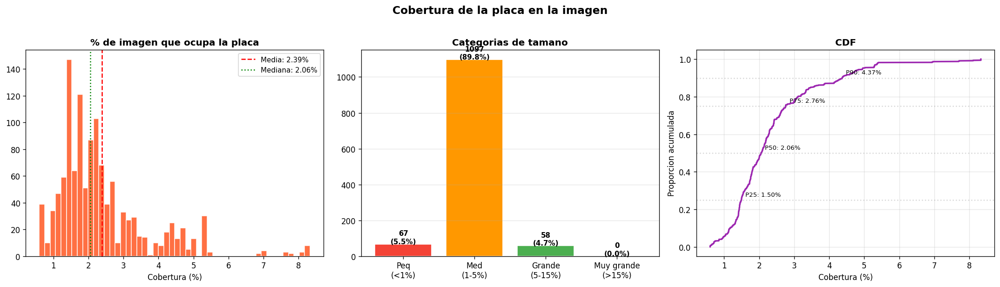

In [34]:
fig, axes = plt.subplots(1, 3, figsize=(18, 5))
areas_pct = [a["width"]*a["height"]*100 for a in placas_annotations]

axes[0].hist(areas_pct, bins=50, color="#FF5722", edgecolor="white", alpha=0.85)
axes[0].axvline(np.mean(areas_pct), color="red", linestyle="--", label=f"Media: {np.mean(areas_pct):.2f}%")
axes[0].axvline(np.median(areas_pct), color="green", linestyle=":", label=f"Mediana: {np.median(areas_pct):.2f}%")
axes[0].set_xlabel("Cobertura (%)"); axes[0].set_title("% de imagen que ocupa la placa", fontweight="bold"); axes[0].legend(fontsize=9)

small=sum(1 for a in areas_pct if a<1); med=sum(1 for a in areas_pct if 1<=a<5)
large=sum(1 for a in areas_pct if 5<=a<15); xlarge=sum(1 for a in areas_pct if a>=15)
cats=["Peq\n(<1%)","Med\n(1-5%)","Grande\n(5-15%)","Muy grande\n(>15%)"]; cat_vals=[small,med,large,xlarge]
bars = axes[1].bar(cats, cat_vals, color=["#F44336","#FF9800","#4CAF50","#2196F3"], edgecolor="white")
for bar,val in zip(bars,cat_vals):
    axes[1].text(bar.get_x()+bar.get_width()/2, bar.get_height()+3, f"{val}\n({val/len(areas_pct)*100:.1f}%)", ha="center", fontsize=9, fontweight="bold")
axes[1].set_title("Categorias de tamano", fontweight="bold"); axes[1].grid(axis="y",alpha=0.3)

sorted_a = np.sort(areas_pct); cdf = np.arange(1,len(sorted_a)+1)/len(sorted_a)
axes[2].plot(sorted_a, cdf, color="#9C27B0", linewidth=2)
for pct in [25,50,75,90]:
    val = np.percentile(areas_pct, pct)
    axes[2].axhline(pct/100, color="gray", linestyle=":", alpha=0.3)
    axes[2].annotate(f"P{pct}: {val:.2f}%", (val, pct/100), textcoords="offset points", xytext=(5,5), fontsize=8)
axes[2].set_xlabel("Cobertura (%)"); axes[2].set_ylabel("Proporcion acumulada")
axes[2].set_title("CDF", fontweight="bold"); axes[2].grid(alpha=0.3)
fig.suptitle("Cobertura de la placa en la imagen", fontsize=14, fontweight="bold", y=1.02)
plt.tight_layout()
fig.savefig(PLACAS_GRAFICAS_DIR / "07_cobertura_placa.png", dpi=150, bbox_inches="tight")
plt.show()

## 4.8 Relacion posicion-tamano (perspectiva)

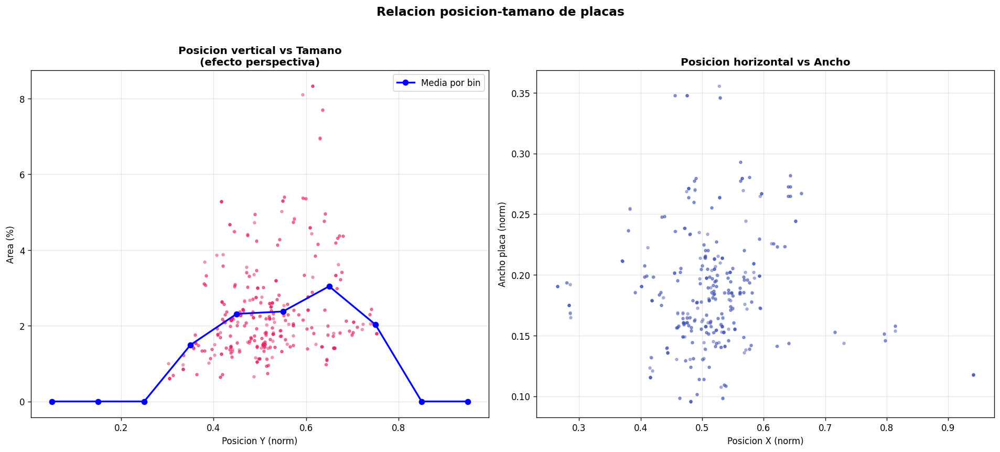

In [35]:
fig, axes = plt.subplots(1, 2, figsize=(16, 7))
pys = np.array([a["y_center"] for a in placas_annotations])
p_areas = np.array([a["width"]*a["height"] for a in placas_annotations])

axes[0].scatter(pys, p_areas*100, alpha=0.15, s=8, c="#E91E63")
axes[0].set_xlabel("Posicion Y (norm)"); axes[0].set_ylabel("Area (%)")
axes[0].set_title("Posicion vertical vs Tamano\n(efecto perspectiva)", fontweight="bold"); axes[0].grid(alpha=0.3)
bins_y = np.linspace(0,1,11); bin_centers = (bins_y[:-1]+bins_y[1:])/2
bin_means = [np.mean(p_areas[(pys>=bins_y[i])&(pys<bins_y[i+1])])*100 if ((pys>=bins_y[i])&(pys<bins_y[i+1])).sum()>0 else 0 for i in range(len(bins_y)-1)]
axes[0].plot(bin_centers, bin_means, "b-o", linewidth=2, markersize=6, label="Media por bin", zorder=5); axes[0].legend()

pxs = np.array([a["x_center"] for a in placas_annotations]); p_widths = np.array([a["width"] for a in placas_annotations])
axes[1].scatter(pxs, p_widths, alpha=0.15, s=8, c="#3F51B5")
axes[1].set_xlabel("Posicion X (norm)"); axes[1].set_ylabel("Ancho placa (norm)")
axes[1].set_title("Posicion horizontal vs Ancho", fontweight="bold"); axes[1].grid(alpha=0.3)
fig.suptitle("Relacion posicion-tamano de placas", fontsize=14, fontweight="bold", y=1.02)
plt.tight_layout()
fig.savefig(PLACAS_GRAFICAS_DIR / "08_posicion_vs_tamano.png", dpi=150, bbox_inches="tight")
plt.show()

## 4.9 Proximidad a bordes

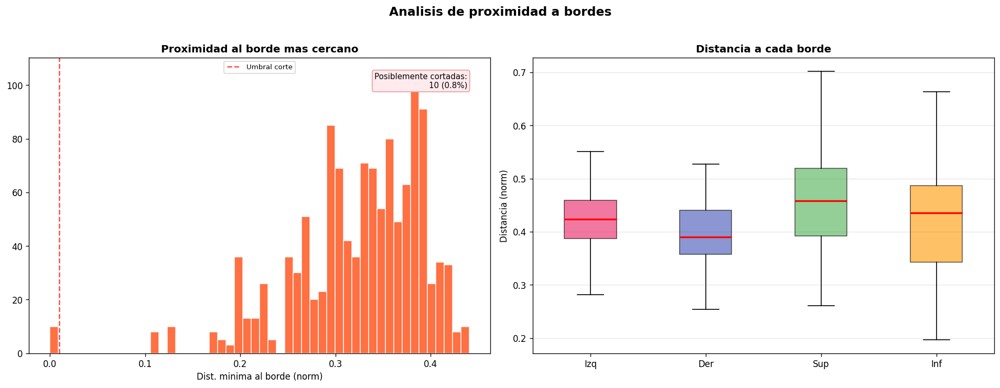

In [36]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
dist_left, dist_right, dist_top, dist_bottom, dist_min = [], [], [], [], []
for a in placas_annotations:
    x1=a["x_center"]-a["width"]/2; y1=a["y_center"]-a["height"]/2
    x2=a["x_center"]+a["width"]/2; y2=a["y_center"]+a["height"]/2
    dl=max(x1,0); dr=max(1-x2,0); dt=max(y1,0); db=max(1-y2,0)
    dist_left.append(dl); dist_right.append(dr); dist_top.append(dt); dist_bottom.append(db)
    dist_min.append(min(dl,dr,dt,db))

axes[0].hist(dist_min, bins=50, color="#FF5722", edgecolor="white", alpha=0.85)
axes[0].set_xlabel("Dist. minima al borde (norm)"); axes[0].set_title("Proximidad al borde mas cercano", fontweight="bold")
n_cut = sum(1 for d in dist_min if d < 0.01)
axes[0].axvline(0.01, color="red", linestyle="--", alpha=0.7, label="Umbral corte")
axes[0].text(0.95,0.95,f"Posiblemente cortadas:\n{n_cut} ({n_cut/len(dist_min)*100:.1f}%)",
             transform=axes[0].transAxes, ha="right", va="top", fontsize=9,
             bbox=dict(boxstyle="round",facecolor="#FFEBEE",edgecolor="#EF9A9A")); axes[0].legend(fontsize=8)

bp = axes[1].boxplot([dist_left,dist_right,dist_top,dist_bottom], tick_labels=["Izq","Der","Sup","Inf"],
                     patch_artist=True, showfliers=False, medianprops=dict(color="red",linewidth=2))
for patch, color in zip(bp["boxes"], ["#E91E63","#3F51B5","#4CAF50","#FF9800"]): patch.set_facecolor(color); patch.set_alpha(0.6)
axes[1].set_ylabel("Distancia (norm)"); axes[1].set_title("Distancia a cada borde", fontweight="bold"); axes[1].grid(axis="y",alpha=0.3)
fig.suptitle("Analisis de proximidad a bordes", fontsize=14, fontweight="bold", y=1.02)
plt.tight_layout()
fig.savefig(PLACAS_GRAFICAS_DIR / "09_proximidad_bordes.png", dpi=150, bbox_inches="tight")
plt.show()

## 4.10 Visualizacion espacial de BBoxes

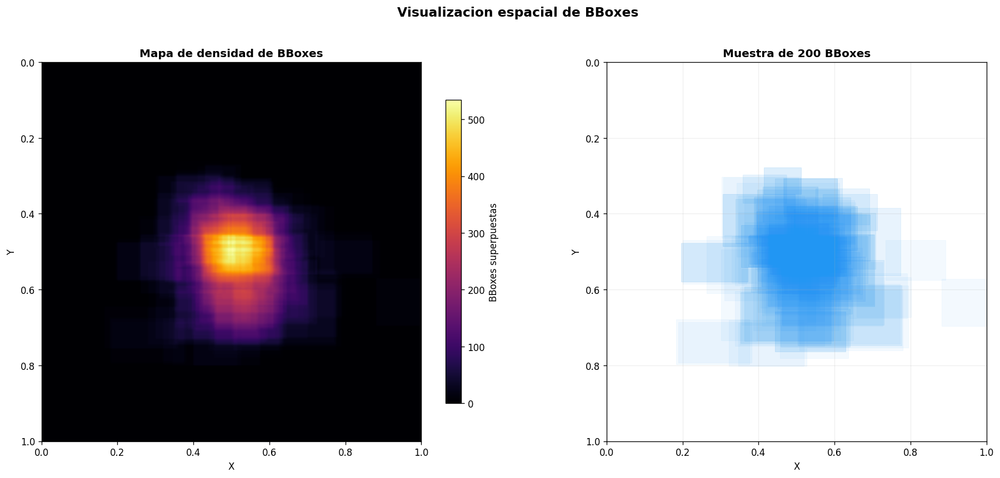

In [37]:
fig, axes = plt.subplots(1, 2, figsize=(16, 7))
resolution = 200; density_map = np.zeros((resolution, resolution))
for a in placas_annotations:
    x1=int(max(0,(a["x_center"]-a["width"]/2))*resolution); y1=int(max(0,(a["y_center"]-a["height"]/2))*resolution)
    x2=min(int(min(1,(a["x_center"]+a["width"]/2))*resolution), resolution)
    y2=min(int(min(1,(a["y_center"]+a["height"]/2))*resolution), resolution)
    if x2>x1 and y2>y1: density_map[y1:y2,x1:x2] += 1
im = axes[0].imshow(density_map, cmap="inferno", aspect="equal", extent=[0,1,1,0], interpolation="bilinear")
axes[0].set_xlabel("X"); axes[0].set_ylabel("Y"); axes[0].set_title("Mapa de densidad de BBoxes", fontweight="bold")
plt.colorbar(im, ax=axes[0], shrink=0.8, label="BBoxes superpuestas")

axes[1].set_xlim(0,1); axes[1].set_ylim(0,1); axes[1].invert_yaxis(); axes[1].set_aspect("equal")
random.seed(42); sample = random.sample(placas_annotations, min(200, len(placas_annotations)))
for a in sample:
    rect = plt.Rectangle((a["x_center"]-a["width"]/2, a["y_center"]-a["height"]/2), a["width"], a["height"],
                         linewidth=0.5, edgecolor="#2196F3", facecolor="#2196F3", alpha=0.05)
    axes[1].add_patch(rect)
axes[1].set_xlabel("X"); axes[1].set_ylabel("Y"); axes[1].set_title("Muestra de 200 BBoxes", fontweight="bold"); axes[1].grid(alpha=0.2)
fig.suptitle("Visualizacion espacial de BBoxes", fontsize=14, fontweight="bold", y=1.02)
plt.tight_layout()
fig.savefig(PLACAS_GRAFICAS_DIR / "10_visualizacion_bboxes.png", dpi=150, bbox_inches="tight")
plt.show()

## 4.11 Ejemplos del dataset de placas

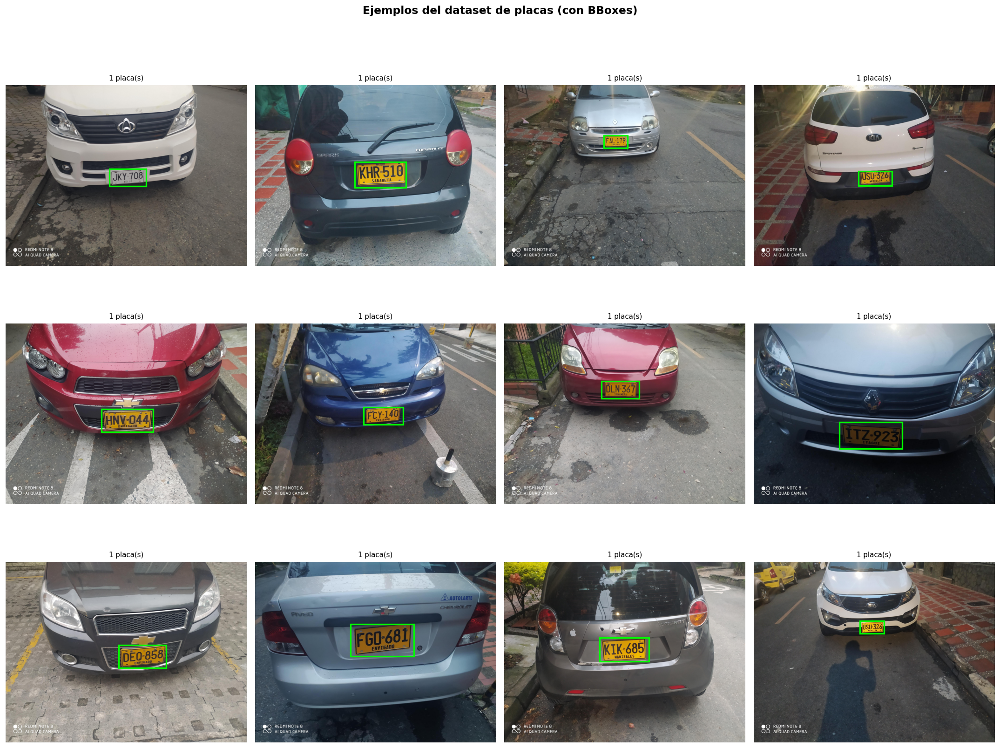

In [38]:
fig, axes = plt.subplots(3, 4, figsize=(18, 14))
axes_flat = axes.flatten()
p_images_dir = PLACAS_OUTPUT_DIR / "train" / "images"
p_labels_dir = PLACAS_OUTPUT_DIR / "train" / "labels"
p_label_files = list(p_labels_dir.glob("*.txt"))
random.seed(42); random.shuffle(p_label_files)
examples = []
for lf in p_label_files:
    if len(examples) >= 12: break
    bboxes = []
    with open(lf, "r") as f:
        for line in f:
            parts = line.strip().split()
            if len(parts) >= 5: bboxes.append([float(p) for p in parts[1:5]])
    if bboxes:
        for ext in [".jpg",".jpeg",".png",".bmp"]:
            img_path = p_images_dir / (lf.stem + ext)
            if img_path.exists(): examples.append((img_path, bboxes)); break
for i, ax in enumerate(axes_flat):
    if i < len(examples):
        img_path, bboxes = examples[i]
        try:
            img = Image.open(img_path); iw, ih = img.size; ax.imshow(img)
            for xc,yc,w,h in bboxes:
                rect = plt.Rectangle(((xc-w/2)*iw,(yc-h/2)*ih), w*iw, h*ih, linewidth=2, edgecolor="lime", facecolor="none")
                ax.add_patch(rect)
            ax.set_title(f"{len(bboxes)} placa(s)", fontsize=9)
        except: ax.text(0.5,0.5,"Error",ha="center",va="center",transform=ax.transAxes)
    else: ax.text(0.5,0.5,"-",ha="center",va="center",transform=ax.transAxes)
    ax.axis("off")
fig.suptitle("Ejemplos del dataset de placas (con BBoxes)", fontsize=14, fontweight="bold", y=1.01)
plt.tight_layout()
fig.savefig(PLACAS_GRAFICAS_DIR / "11_ejemplos_placas.png", dpi=150, bbox_inches="tight")
plt.show()

## 4.12 Resoluciones de imagenes

Resoluciones leidas: 1212 imagenes


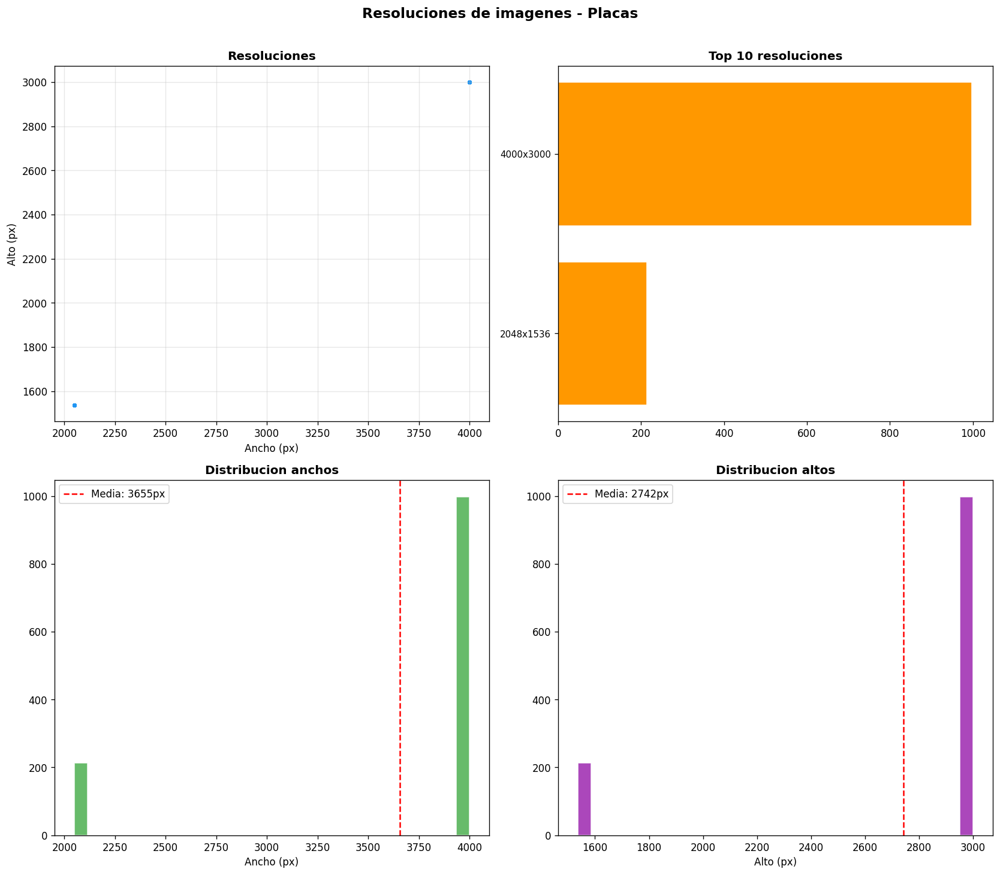

In [39]:
all_sizes = []
for split in SPLITS:
    img_dir = PLACAS_OUTPUT_DIR / split / "images"
    if not img_dir.exists(): continue
    for img_path in img_dir.glob("*.*"):
        try:
            with Image.open(img_path) as img: all_sizes.append({"w": img.width, "h": img.height})
        except: pass
print(f"Resoluciones leidas: {len(all_sizes)} imagenes")

fig, axes = plt.subplots(2, 2, figsize=(14, 12))
ws = [s["w"] for s in all_sizes]; hs = [s["h"] for s in all_sizes]
res_counts = Counter(f"{s['w']}x{s['h']}" for s in all_sizes)

axes[0][0].scatter(ws, hs, alpha=0.2, s=10, c="#2196F3")
axes[0][0].set_xlabel("Ancho (px)"); axes[0][0].set_ylabel("Alto (px)")
axes[0][0].set_title("Resoluciones", fontweight="bold"); axes[0][0].grid(alpha=0.3)

top_res = res_counts.most_common(10)
axes[0][1].barh(range(len(top_res)), [v for _,v in top_res], color="#FF9800", edgecolor="white")
axes[0][1].set_yticks(range(len(top_res))); axes[0][1].set_yticklabels([r for r,_ in top_res], fontsize=9)
axes[0][1].invert_yaxis(); axes[0][1].set_title("Top 10 resoluciones", fontweight="bold")

axes[1][0].hist(ws, bins=30, color="#4CAF50", edgecolor="white", alpha=0.85)
axes[1][0].axvline(np.mean(ws), color="red", linestyle="--", label=f"Media: {np.mean(ws):.0f}px")
axes[1][0].set_xlabel("Ancho (px)"); axes[1][0].set_title("Distribucion anchos", fontweight="bold"); axes[1][0].legend()

axes[1][1].hist(hs, bins=30, color="#9C27B0", edgecolor="white", alpha=0.85)
axes[1][1].axvline(np.mean(hs), color="red", linestyle="--", label=f"Media: {np.mean(hs):.0f}px")
axes[1][1].set_xlabel("Alto (px)"); axes[1][1].set_title("Distribucion altos", fontweight="bold"); axes[1][1].legend()

fig.suptitle("Resoluciones de imagenes - Placas", fontsize=14, fontweight="bold", y=1.01)
plt.tight_layout()
fig.savefig(PLACAS_GRAFICAS_DIR / "12_resoluciones_imagenes.png", dpi=150, bbox_inches="tight")
plt.show()

## 4.13 Dashboard resumen - Dataset de Placas

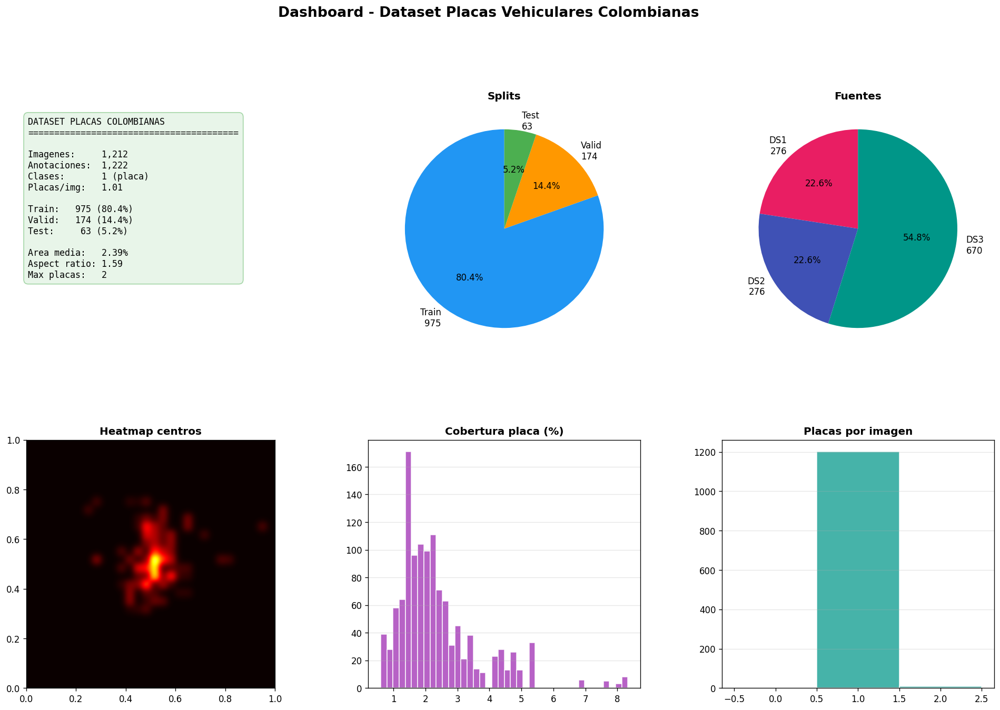

In [40]:
fig = plt.figure(figsize=(20, 12))
gs = gridspec.GridSpec(2, 3, figure=fig, hspace=0.35, wspace=0.3)
total_imgs = sum(len(placas_files[s]) for s in SPLITS)
total_annots = len(placas_annotations)
p_areas = [a["width"]*a["height"] for a in placas_annotations]
p_ar = [a["width"]/max(a["height"],1e-6) for a in placas_annotations]
p_counts = []; [p_counts.extend([f["num_annotations"] for f in placas_files[s]]) for s in SPLITS]

ax = fig.add_subplot(gs[0,0]); ax.axis("off")
kpi = (f"DATASET PLACAS COLOMBIANAS\n{'='*40}\n\nImagenes:     {total_imgs:,}\nAnotaciones:  {total_annots:,}\n"
       f"Clases:       1 (placa)\nPlacas/img:   {total_annots/total_imgs:.2f}\n\n"
       f"Train: {len(placas_files['train']):>5} ({len(placas_files['train'])/total_imgs*100:.1f}%)\n"
       f"Valid: {len(placas_files['valid']):>5} ({len(placas_files['valid'])/total_imgs*100:.1f}%)\n"
       f"Test:  {len(placas_files['test']):>5} ({len(placas_files['test'])/total_imgs*100:.1f}%)\n\n"
       f"Area media:   {np.mean(p_areas)*100:.2f}%\nAspect ratio: {np.median(p_ar):.2f}\n"
       f"Max placas:   {max(p_counts)}")
ax.text(0.05,0.95,kpi,transform=ax.transAxes,fontsize=10,va="top",fontfamily="monospace",
        bbox=dict(boxstyle="round,pad=0.5",facecolor="#E8F5E9",edgecolor="#A5D6A7"))

ax = fig.add_subplot(gs[0,1])
ax.pie([len(placas_files[s]) for s in SPLITS], labels=[f"{SPLIT_LABELS[s]}\n{len(placas_files[s])}" for s in SPLITS],
       colors=[SPLIT_COLORS[s] for s in SPLITS], autopct="%1.1f%%", startangle=90); ax.set_title("Splits", fontweight="bold")

ax = fig.add_subplot(gs[0,2])
src_c = Counter(a["source"] for a in placas_annotations); srcs = sorted(src_c.keys())
ax.pie([src_c[s] for s in srcs], labels=[f"{s}\n{src_c[s]}" for s in srcs],
       colors=[SOURCE_COLORS.get(s,"#9E9E9E") for s in srcs], autopct="%1.1f%%", startangle=90)
ax.set_title("Fuentes", fontweight="bold")

ax = fig.add_subplot(gs[1,0])
xs=[a["x_center"] for a in placas_annotations]; ys=[a["y_center"] for a in placas_annotations]
hm,_,_=np.histogram2d(xs,ys,bins=30,range=[[0,1],[0,1]])
ax.imshow(hm.T,origin="lower",cmap="hot",extent=[0,1,0,1],aspect="equal",interpolation="gaussian")
ax.set_title("Heatmap centros", fontweight="bold")

ax = fig.add_subplot(gs[1,1])
ax.hist([a*100 for a in p_areas], bins=40, color="#AB47BC", edgecolor="white", alpha=0.85)
ax.set_title("Cobertura placa (%)", fontweight="bold"); ax.grid(axis="y",alpha=0.3)

ax = fig.add_subplot(gs[1,2])
ax.hist(p_counts, bins=range(0,max(p_counts)+2), color="#26A69A", edgecolor="white", alpha=0.85, align="left")
ax.set_title("Placas por imagen", fontweight="bold"); ax.grid(axis="y",alpha=0.3)

fig.suptitle("Dashboard - Dataset Placas Vehiculares Colombianas", fontsize=16, fontweight="bold", y=1.01)
fig.savefig(PLACAS_GRAFICAS_DIR / "13_dashboard_resumen.png", dpi=150, bbox_inches="tight")
plt.show()